# 0.a. Import and settings

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import scanpy as sc
from scanpy.plotting._tools.scatterplots import plot_scatter
import scanpy_scripts as ss
import bbknn

expr_cmap = ss.lib.expression_colormap(background_level=0.01)
np.set_printoptions(linewidth=180)
sc.settings.verbosity = 1
sc.settings.figdir = 'png'

In [3]:
os.environ['PATH'] = '/home/ubuntu/miniconda/envs/scrna/bin:' + os.environ['PATH']

# 0.b. Define functions

In [26]:
import warnings
warnings.filterwarnings(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

In [27]:
def diffexp(
    adata, basis='umap', key=None, res=None, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None, **kwargs
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_tbl = ss.lib.diffexp(
        adata, key_added=grp_key, groupby=f'leiden_{grp_key}', method=method,
        filter_params=filter_params, **kwargs,
    )
    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(adata, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        adata,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        adata, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(adata, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

In [28]:
def update_diffexp(
    ad, basis='umap', key=None, res=None,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None,
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_key = f'rank_genes_groups_{grp_key}'
    if filter_params:
        sc.tl.filter_rank_genes_groups(
            ad,
            key=de_key,
            key_added=de_key + '_filtered',
            use_raw=True,
            **filter_params,
        )
    de_tbl = ss.lib.extract_de_table(ad.uns[de_key + '_filtered'])
    de_tbl = de_tbl.loc[de_tbl.genes.astype(str) != 'nan', :]

    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(ad, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        ad,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        ad, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(ad, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

# 1. Load data

In [7]:
fetal_ad = sc.read('data/h5ad/fetal_skin_raw.h5ad', mode='r')

In [8]:
fetal_ad.obs.head()

,bh_doublet_pval,cell_caller,cluster_scrublet_score,doublet_pval,mt_prop,n_counts,n_genes,sanger_id,scrublet_score,chemistry,donor,gender,pcw,sorting,sample,chemistry_sorting
index,,,,,,,,,,,,,,,,
AAACCTGCACTCTGTC-1-4834STDY7002879,0.907861,Empt,0.164557,0.455284,0.202597,385.0,239,4834STDY7002879,0.105590,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAACCTGGTCAGTGGA-1-4834STDY7002879,0.907861,Both,0.157082,0.500000,0.062532,5917.0,1776,4834STDY7002879,0.225806,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAAGATGGTCGATTGT-1-4834STDY7002879,0.907861,Both,0.157082,0.500000,0.030894,10261.0,2750,4834STDY7002879,0.149606,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAAGCAAAGATGTGGC-1-4834STDY7002879,0.882352,Both,0.225806,0.150885,0.012647,7749.0,2308,4834STDY7002879,0.201970,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAAGCAACAAGCCGTC-1-4834STDY7002879,0.907861,Empt,0.164557,0.455284,0.197686,1037.0,606,4834STDY7002879,0.225806,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P


In [9]:
spleen_samples = ['F69-GEX_1_SPL_45P', 'F69-GEX_2_SPL_45N', 'F69-GEX_3_SPL_45N']

In [10]:
fetal_ad = fetal_ad[~fetal_ad.obs['sample'].isin(spleen_samples), :]

In [11]:
fetal_ad

View of AnnData object with n_obs × n_vars = 235201 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting'
    var: 'gene_ids'

In [12]:
g1_s = pd.read_csv('data/misc/G1-S_genes.list', header=None, names=['gene'])
g2_m = pd.read_csv('data/misc/G2-M_genes.list', header=None, names=['gene'])
jp_cc = pd.read_csv('data/misc/JP_cycle_genes.list', header=None, names=['gene'])

In [13]:
cc_genes = list(pd.concat([g1_s, g2_m, jp_cc]).gene.values)

In [14]:
fetal_ad.var['cc'] = fetal_ad.var_names.isin(cc_genes)

In [15]:
annot = pd.read_csv('fetal_annotation_rachel-201904.txt', sep='\t', header=None, names=['index', 'annot'], index_col=0)

In [16]:
fetal_ad.obs['annot'] = fetal_ad.obs.merge(annot, how='left', left_index=True, right_index=True)['annot']

In [17]:
fetal_ad.obs['doublet'] = fetal_ad.obs['bh_doublet_pval'] < 0.1

In [18]:
hierarchy1 = pd.read_csv('hierarchy1.txt', sep='\t', index_col=0)

In [19]:
fetal_ad.obs = fetal_ad.obs.merge(hierarchy1, how='left', left_index=True, right_index=True)

In [20]:
ad = fetal_ad[(fetal_ad.obs['hierarchy1'] == 2), :]

In [21]:
ad.obs['sample'].value_counts()

F51_SK_CD45P_5        2682
F38_male_12PCW        2559
F51_SK_CD45P_6        2287
F50_SK_CD45P_6        2227
F50_SK_CD45P_5        1495
F33_female_9+5PCW     1379
F45_female_13+6PCW    1129
F41_female_16PCW      1032
F35_female_7+6PCW      884
F71-GEX_1_SKI_45P      690
F34_female_8+1PCW      684
F71-GEX_2_SKI_45P      567
F69-GEX_4_SKI_45P      412
F32_female_7+6PCW      290
F16_male_8+1PCW        152
F17_male_9+1PCW        129
F19_female_10+2PCW     111
F61_SK_CD45P_1          14
F71-GEX_3_SKI_45N        5
F69-GEX_7_SKI_45en       2
F69-GEX_5_SKI_45N        1
F71-GEX_4_SKI_45N        1
Name: sample, dtype: int64

In [22]:
sample_sizes = ad.obs['sample'].value_counts()

In [23]:
valid_batches = sample_sizes[sample_sizes >= 10].index.to_list()

In [24]:
ad = ad[ad.obs['sample'].isin(valid_batches), :]

In [25]:
ad

View of AnnData object with n_obs × n_vars = 18723 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1'
    var: 'gene_ids', 'cc'

In [26]:
ad.write('data/h5ad/fetal_skin_hierarch1_T-cells.h5ad', compression='gzip')

... storing 'annot' as categorical


# 2. QC

In [7]:
ad = sc.read('data/h5ad/fetal_skin_hierarch1_T-cells.h5ad')

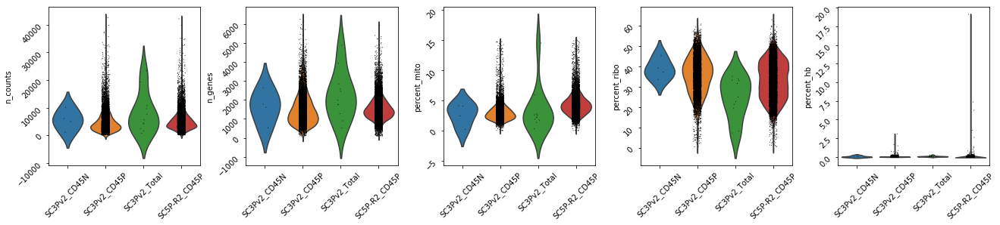

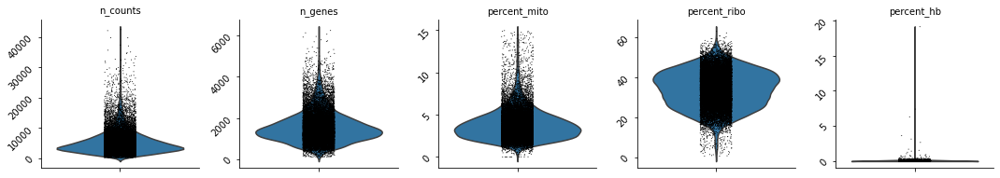

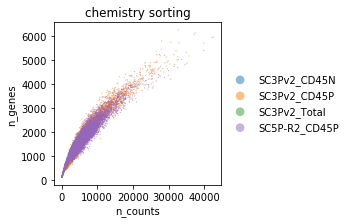

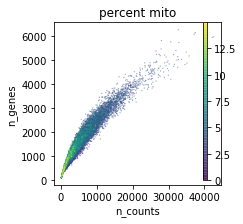

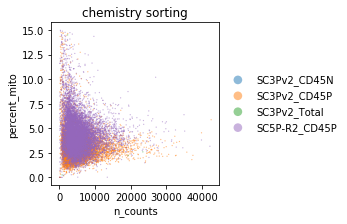

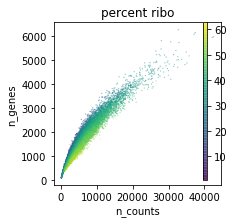

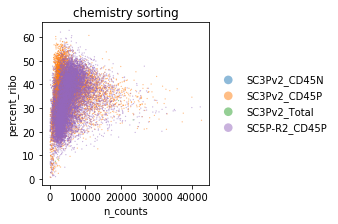

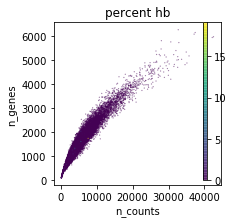

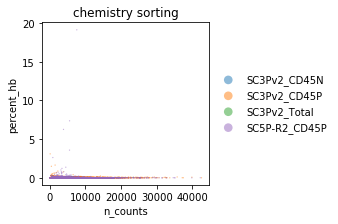

AnnData object with n_obs × n_vars = 18723 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells'
    uns: 'chemistry_sorting_colors'

In [52]:
rcParams.update({'figure.figsize': (4,4)})
ss.lib.simple_default_pipeline(ad, qc_only=True, batch='chemistry_sorting')

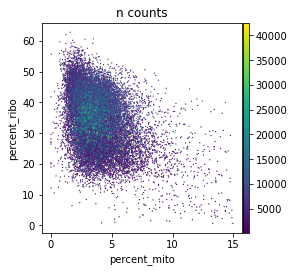

In [63]:
rcParams.update({'figure.figsize': (4,4)})
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_counts')

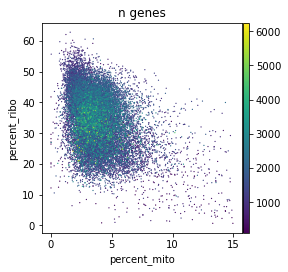

In [64]:
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_genes')

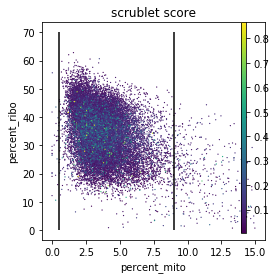

In [67]:
fig, ax = plt.subplots()
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='scrublet_score', ax=ax, show=False)
ax.vlines(x=[0.5, 9.0], ymin=0, ymax=70)

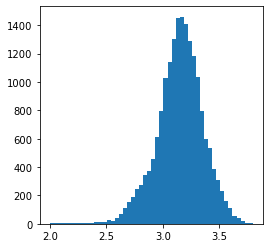

In [68]:
_ = plt.hist(np.log10(ad.obs.loc[(ad.obs.percent_mito>0.5)&(ad.obs.percent_mito<=9),'n_genes']), bins=50)

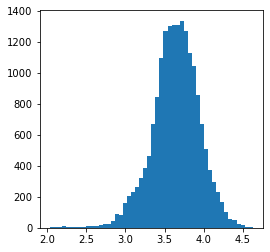

In [69]:
_ = plt.hist(np.log10(ad.obs.loc[(ad.obs.percent_mito>0.5)&(ad.obs.percent_mito<=9),'n_counts']), bins=50)

# 3. Default preprocessing

In [70]:
ad = ad[
    (ad.obs.percent_mito>=0.5) &
    (ad.obs.percent_mito<9) &
    (ad.obs.n_genes>=200) &
    (ad.obs.n_counts>=300) &
    (ad.obs.percent_hb<2.5), :]
ad = ad[:, (ad.var.n_cells>=3)]

In [71]:
ad

View of AnnData object with n_obs × n_vars = 18292 × 20693 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells'

In [76]:
ad1 = ad.copy()[:, ~(ad.var.mito | ad.var.hb | ad.var.ribo)]
ad2 = ad.copy()[:,~(ad.var.mito | ad.var.hb | ad.var.ribo | ad.var.cc)]

In [77]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 18292 × 20567 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap_orig'
    varm: 'PCs'

In [78]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 18292 × 20005 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap_orig'
    varm: 'PCs'

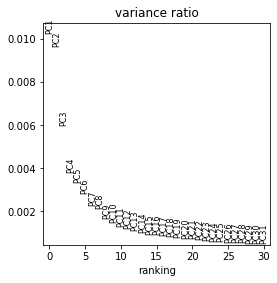

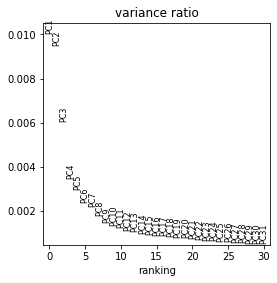

In [82]:
rcParams.update({'figure.figsize': (4,4)})
sc.pl.pca_variance_ratio(ad1, n_pcs=30)
sc.pl.pca_variance_ratio(ad2, n_pcs=30)

In [85]:
k_annot = (ad1.obs['annot'] != 'nan').values
ad1.obs['lr_annot'] = ss.lib.LR_annotate(ad1, train_label=ad1.obs['annot'].values, train_x=ad1.obsm['X_pca'],
                                        subset=k_annot, use_rep='X_pca', return_label=True)
ad1.obs['lr_annot'] = ad1.obs['lr_annot'].astype('category')

In [86]:
k_annot = (ad2.obs['annot'] != 'nan').values
ad2.obs['lr_annot'] = ss.lib.LR_annotate(ad2, train_label=ad2.obs['annot'].values, train_x=ad2.obsm['X_pca'],
                                        subset=k_annot, use_rep='X_pca', return_label=True)
ad2.obs['lr_annot'] = ad2.obs['lr_annot'].astype('category')

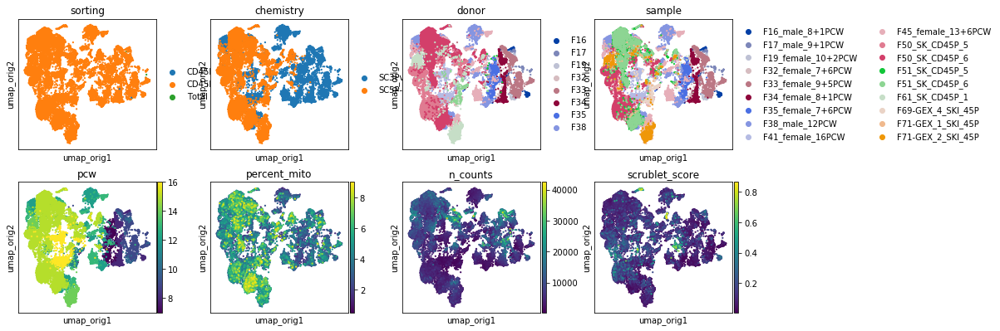

In [87]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_orig',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

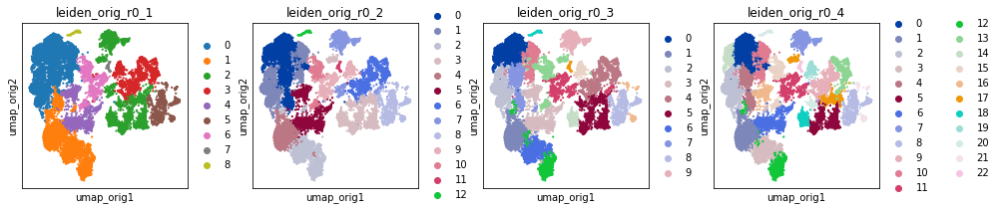

In [88]:
plot_scatter(ad1, basis='umap_orig', color_map=expr_cmap,
             color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=20, ncols=4)

In [94]:
doublet_freq = ad1.obs.groupby('leiden_orig_r0_1')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                      freq         p
leiden_orig_r0_1                    
0                 0.011644  0.750000
1                 0.025378  0.639458
2                 0.017550  0.750000
3                 0.000000  0.750000
4                 0.000000  0.750000
5                 0.000000  0.750000
6                 0.005607  0.750000
7                 0.058824  0.014128
8                 0.375000  0.000000


In [95]:
doublet_freq = ad1.obs.groupby('leiden_orig_r0_1')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                     score             p
leiden_orig_r0_1                        
0                 0.080648  8.305148e-01
1                 0.078430  8.305148e-01
2                 0.076653  8.437504e-01
3                 0.078658  8.305148e-01
4                 0.080900  8.305148e-01
5                 0.055192  9.999914e-01
6                 0.112142  1.585819e-07
7                 0.358405  0.000000e+00
8                 0.423527  0.000000e+00


In [76]:
ad1 = ad1[~ad1.obs['leiden_orig_r0_2'].isin(['5', '6']), :]

In [77]:
ad1.X = ad1.raw.X

In [78]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None,
    norm_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig2'},
    umap_params={'use_graph': 'neighbors_orig2', 'key_added': 'orig2'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'key_added': 'orig2'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 1595 × 18593 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', '__is_in_cluster__', 'leiden_orig2_r0_1', 'leiden_orig2_r0_2', 'leiden_orig2_r0_3', 'leiden_orig2_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'rank_genes_groups_orig_r0_2', 'rank_genes_groups_orig_r0_2_filtered', 'leiden_orig_r0_2_colors', 'neighbors_orig2', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_umap_orig2'
    varm: 'PCs'

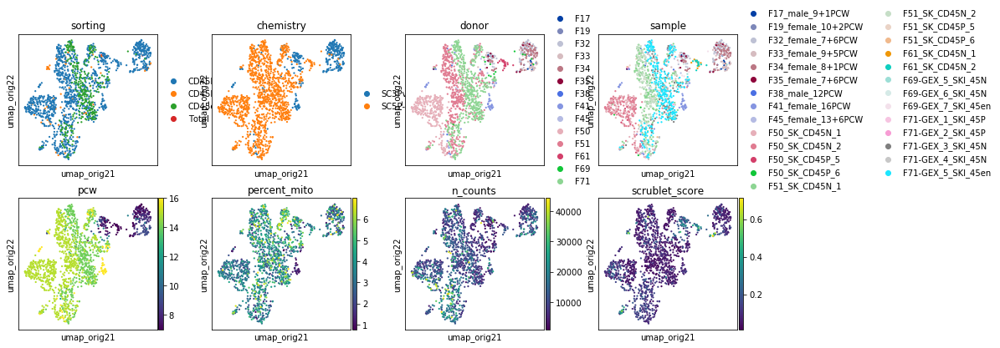

In [81]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_orig2',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

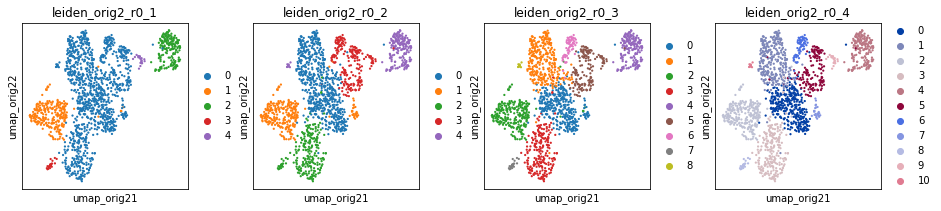

In [80]:
plot_scatter(ad1, basis='umap_orig2', color_map=expr_cmap,
             color=[f'leiden_orig2_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=20, ncols=4)

,cluster,ref,rank,genes,scores
16,0,rest,16,PASK,0.203866
22,0,rest,22,CD5,0.187992
32,0,rest,32,LEF1,0.170353
46,0,rest,46,ICOS,0.157108
681,0,rest,681,SELL,0.066954
20567,1,rest,0,GZMK,0.381282
20570,1,rest,3,AOAH,0.316243
20602,1,rest,35,SLA2,0.166539
20616,1,rest,49,SH2D1B,0.154912
20691,1,rest,124,PLEK,0.119637


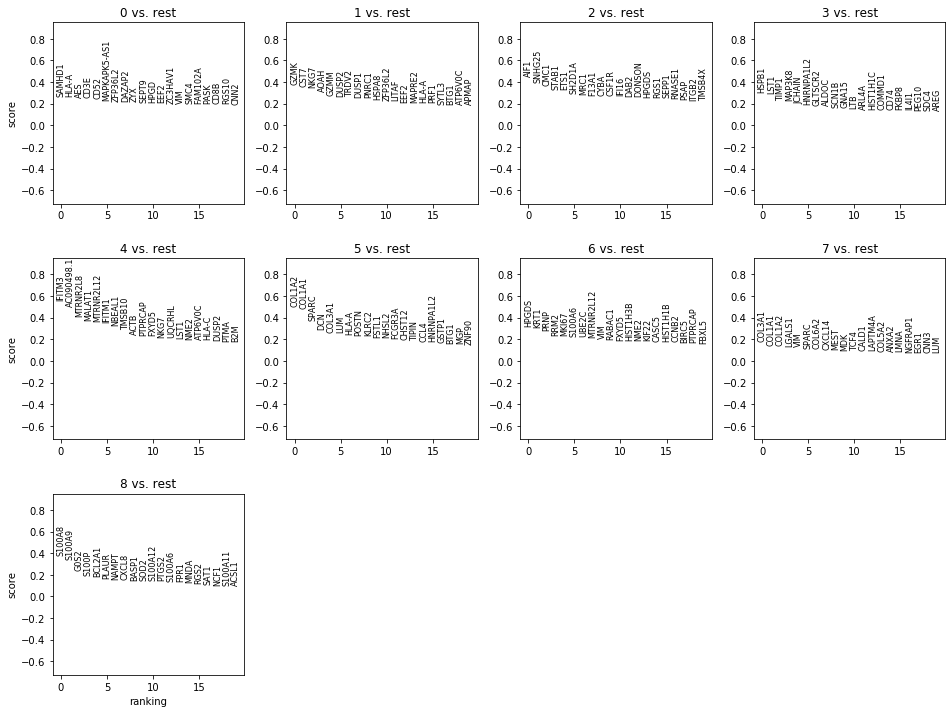

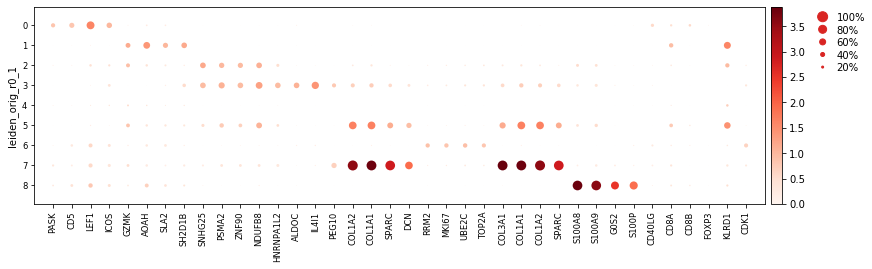

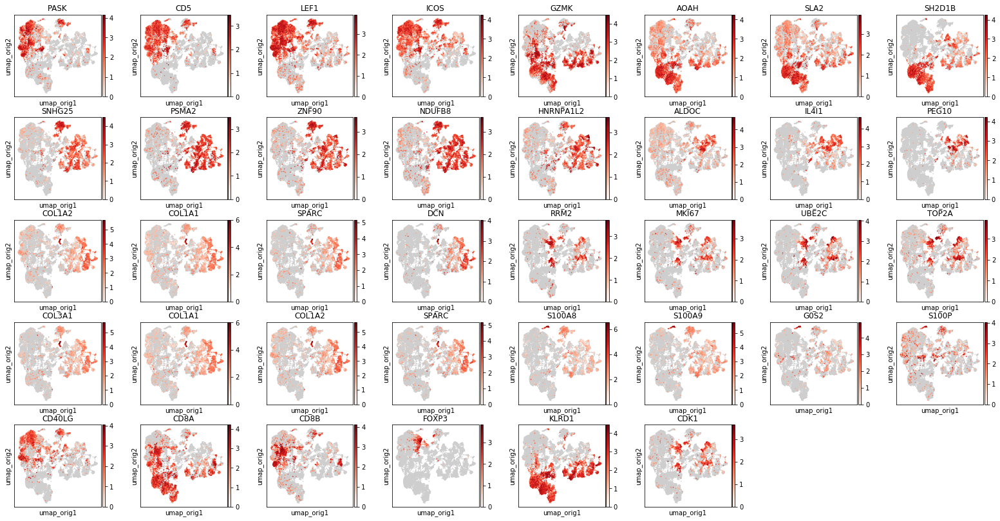

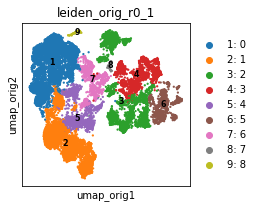

In [92]:
orig_de_genes1 = diffexp(
    ad1, basis='umap', key='orig', res=0.1,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK', 'CDK1', 'MCM2']
)
orig_de_genes1.groupby('cluster').head(5)

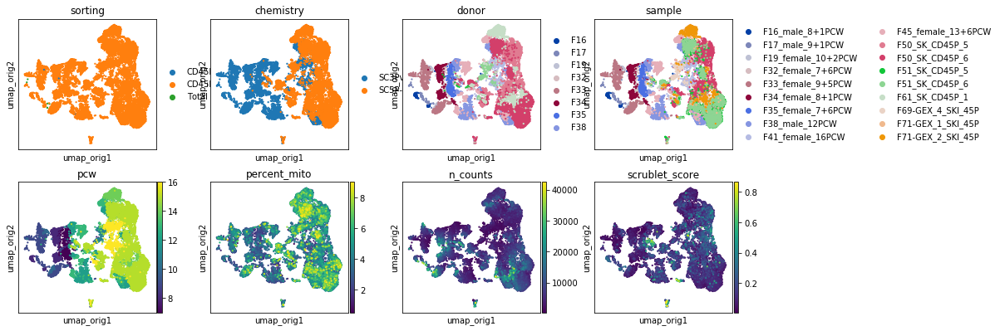

In [96]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_orig',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

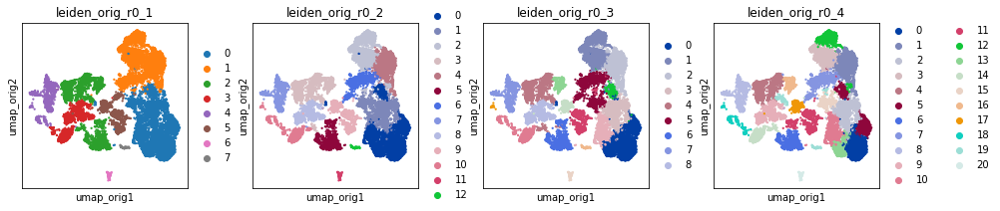

In [97]:
plot_scatter(ad2, basis='umap_orig', color_map=expr_cmap,
             color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=20, ncols=4)

In [98]:
doublet_freq = ad2.obs.groupby('leiden_orig_r0_1')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                      freq         p
leiden_orig_r0_1                    
0                 0.012184  0.764734
1                 0.019202  0.764734
2                 0.017608  0.764734
3                 0.000000  0.764734
4                 0.000000  0.764734
5                 0.001946  0.764734
6                 0.058824  0.066679
7                 0.375000  0.000000


In [99]:
doublet_freq = ad2.obs.groupby('leiden_orig_r0_1')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                     score         p
leiden_orig_r0_1                    
0                 0.086095  0.755142
1                 0.073475  0.755142
2                 0.076135  0.755142
3                 0.070483  0.755142
4                 0.057147  0.824970
5                 0.112319  0.298324
6                 0.358405  0.000000
7                 0.423527  0.000000


,cluster,ref,rank,genes,scores
18039,1,rest,8,SPOCK1,0.130958
18054,1,rest,23,SHH,0.096083
36065,2,rest,3,HSPA6,0.183993
36066,2,rest,4,ZFAND2A,0.174388
36074,2,rest,12,CTGF,0.120538
54093,3,rest,0,KRT4,0.152183
54096,3,rest,3,CLIC3,0.110272
54097,3,rest,4,IGFL2,0.105689
54100,3,rest,7,CLDN4,0.086288
54101,3,rest,8,SPRR3,0.084746


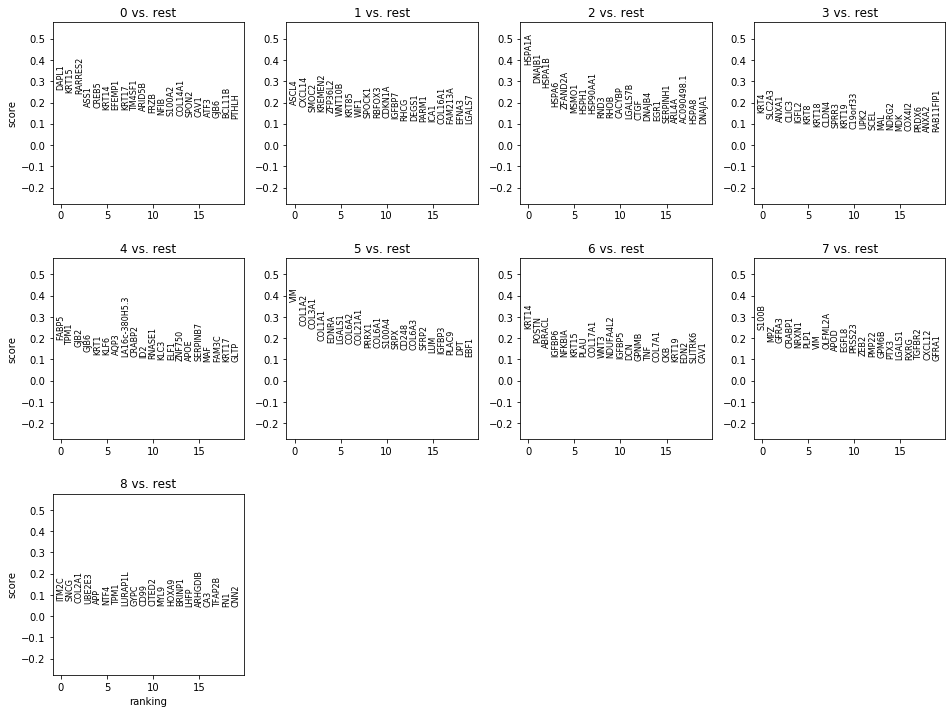

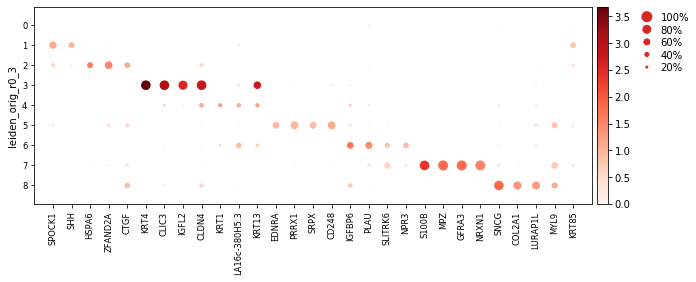

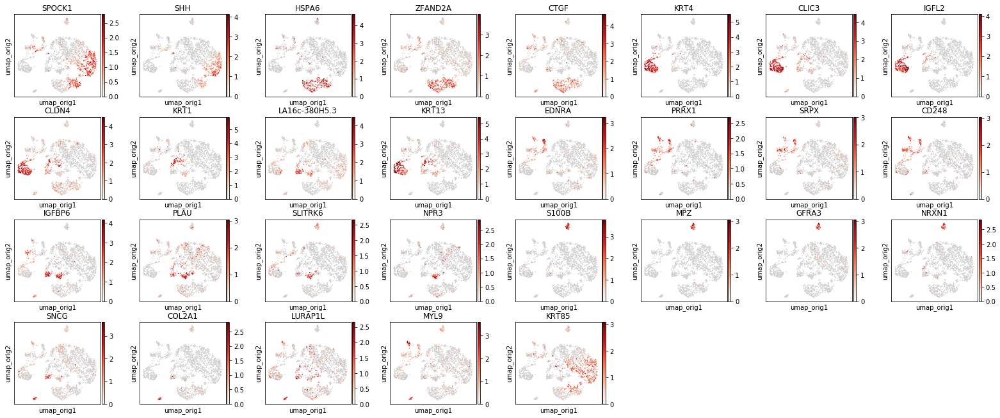

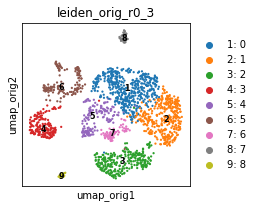

In [13]:
orig_de_genes2 = diffexp(
    ad2, basis='umap', key='orig', res=0.3, method='logreg'
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK']
)
orig_de_genes2.groupby('cluster').head(5)

In [17]:
adt = ad1.copy()
adt.obs['leiden_orig_nocc_r0_3'] = ad2.obs['leiden_orig_r0_3']
ss.lib.cross_table(adt, 'leiden_orig_nocc_r0_3', 'leiden_orig_r0_3', highlight=True)

leiden_orig_r0_3,0,1,2,3,4,5,6,7,8
leiden_orig_nocc_r0_3,,,,,,,,,
0,345,27,4,104,0,1,6,1,0
1,4,287,1,68,0,0,0,0,0
2,1,0,241,37,0,0,0,0,0
3,1,0,0,0,187,0,0,0,0
4,1,6,0,2,9,138,0,0,0
5,0,0,1,13,0,0,136,0,0
6,2,0,1,1,0,1,0,66,0
7,0,0,0,0,0,0,0,0,34
8,0,0,0,0,0,21,0,0,0


# 4.1 Harmony

In [147]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
#     harmony_params=None,
    harmony_params={'batch': 'sample'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 18292 × 20567 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'rank_genes_groups_orig_r0_1', 'rank_genes_groups_orig_r0_1_fi

In [148]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
#     harmony_params=None,
    harmony_params={'batch': 'sample'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 18292 × 20005 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_bk', 'leiden_bk_r0_1_colors', 'leiden_bk_r0_2_color

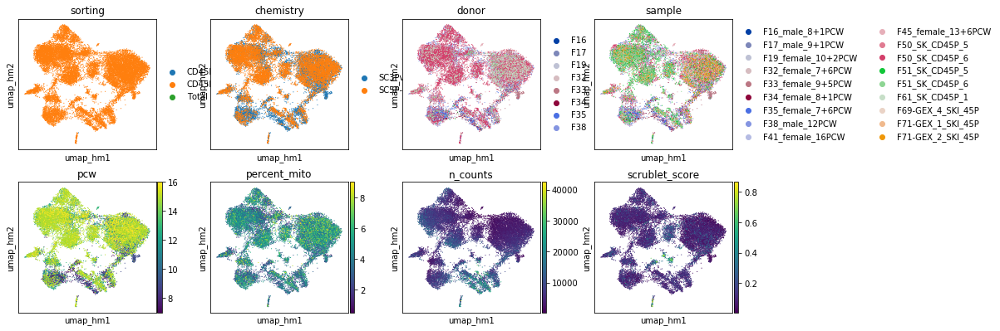

In [167]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_hm',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=5)

In [152]:
ss.lib.leiden(ad1, use_graph='neighbors_hm', key_added='hm', resolution=[0.5, 0.6, 0.7])

AnnData object with n_obs × n_vars = 18292 × 20567 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'rank_ge

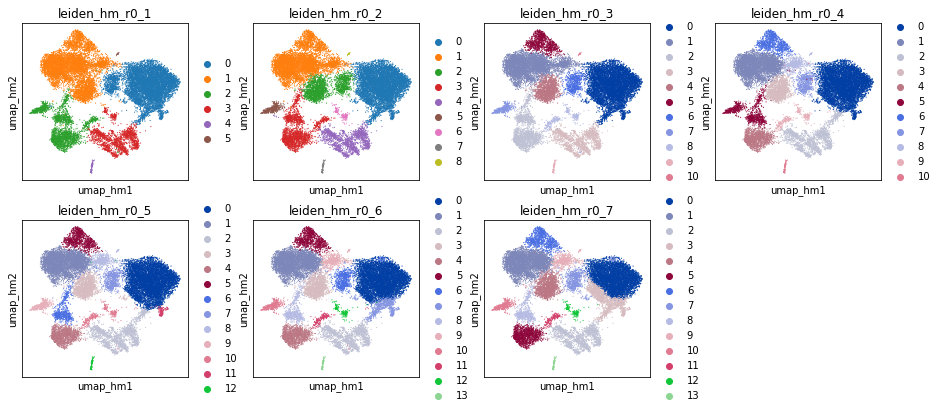

In [153]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_hm', color=[f'leiden_hm_r0_{i}' for i in (1,2,3,4,5,6,7)], size=5)

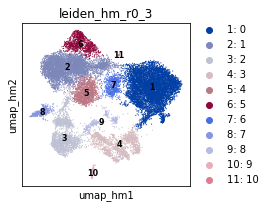

In [158]:
ss.lib.plot_embedding(ad1, basis='umap_hm', groupby='leiden_hm_r0_3', size=5)

In [171]:
doublet_freq = ad1.obs.groupby('leiden_hm_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq         p
leiden_hm_r0_3                    
0               0.004858  0.847285
1               0.005804  0.847285
2               0.001088  0.863872
3               0.002548  0.863872
4               0.008615  0.687499
5               0.005336  0.847285
6               0.128399  0.000000
7               0.002604  0.863872
8               0.245014  0.000000
9               0.052632  0.000000
10              0.000000  0.863872


In [172]:
doublet_freq = ad1.obs.groupby('leiden_hm_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                   score             p
leiden_hm_r0_3                        
0               0.060743  8.954275e-01
1               0.074476  8.250004e-01
2               0.080497  8.098294e-01
3               0.090407  7.596167e-01
4               0.087292  7.596167e-01
5               0.087935  7.596167e-01
6               0.150989  1.891873e-02
7               0.110761  5.346200e-01
8               0.283884  6.106227e-16
9               0.334961  0.000000e+00
10              0.101143  7.143603e-01


In [24]:
ad1.uns['rank_genes_groups_hm_r0_3_filtered']

{'params': {'corr_method': 'benjamini-hochberg',
  'groupby': 'leiden_hm_r0_3',
  'method': 'logreg',
  'reference': 'rest',
  'use_raw': True},
 'scores': array([( 0.5912003 ,  0.5903802 ,  0.42634577,  0.48345488,  1.0918623 ,  0.44696102,  0.7533873 ,  0.5034392 ,  0.2996988 ,  0.1955586 ,  0.10841697),
        ( 0.5771011 ,  0.49190217,  0.334565  ,  0.42044166,  0.7981459 ,  0.36356765,  0.5896512 ,  0.35075247,  0.29664987,  0.16774543,  0.10199527),
        ( 0.40045604,  0.42704165,  0.33367997,  0.3982934 ,  0.65782547,  0.34998387,  0.5097048 ,  0.2651776 ,  0.27710855,  0.16142249,  0.09523955), ...,
        (-0.34390473, -0.64225817, -0.25087166, -0.19506986, -0.3031028 , -0.26823127, -0.34172985, -0.18903199, -0.2141053 , -0.12090719, -0.0842369 ),
        (-0.37576038, -0.85274476, -0.32193267, -0.21539247, -0.32741845, -0.32326263, -0.419202  , -0.18990205, -0.22030602, -0.12766808, -0.08990776),
        (-0.47102794, -0.9591431 , -0.36616427, -0.34593755, -0.35239774, -

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
9,0,rest,9,GZMB,79.189758,4.755373,0.000000e+00,0.000000e+00
11,0,rest,11,KLRD1,76.996292,3.922951,0.000000e+00,0.000000e+00
12,0,rest,12,PRF1,75.004524,3.775664,0.000000e+00,0.000000e+00
13,0,rest,13,XCL2,69.485046,3.876964,0.000000e+00,0.000000e+00
14,0,rest,14,GNLY,67.878487,4.668217,0.000000e+00,0.000000e+00
20582,1,rest,15,CD40LG,41.526779,3.517450,0.000000e+00,0.000000e+00
20584,1,rest,17,ICOS,39.930565,2.484703,0.000000e+00,0.000000e+00
20594,1,rest,27,CD5,34.947666,2.376847,2.322552e-245,8.845912e-243
20596,1,rest,29,LYPD3,33.686722,2.457312,4.835705e-229,1.685694e-226
20608,1,rest,41,TESPA1,31.027355,2.144875,1.902398e-197,5.216882e-195


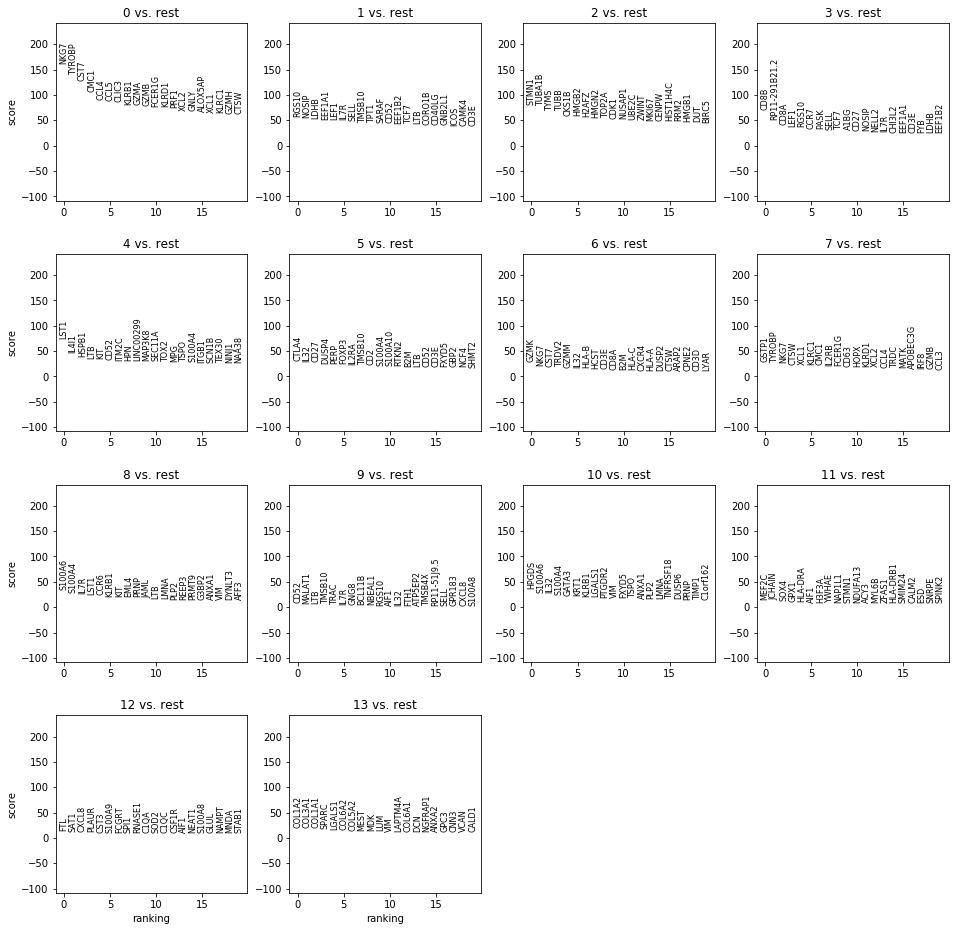

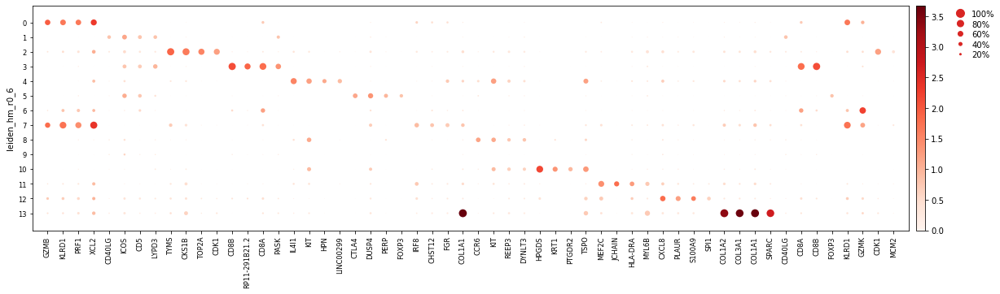

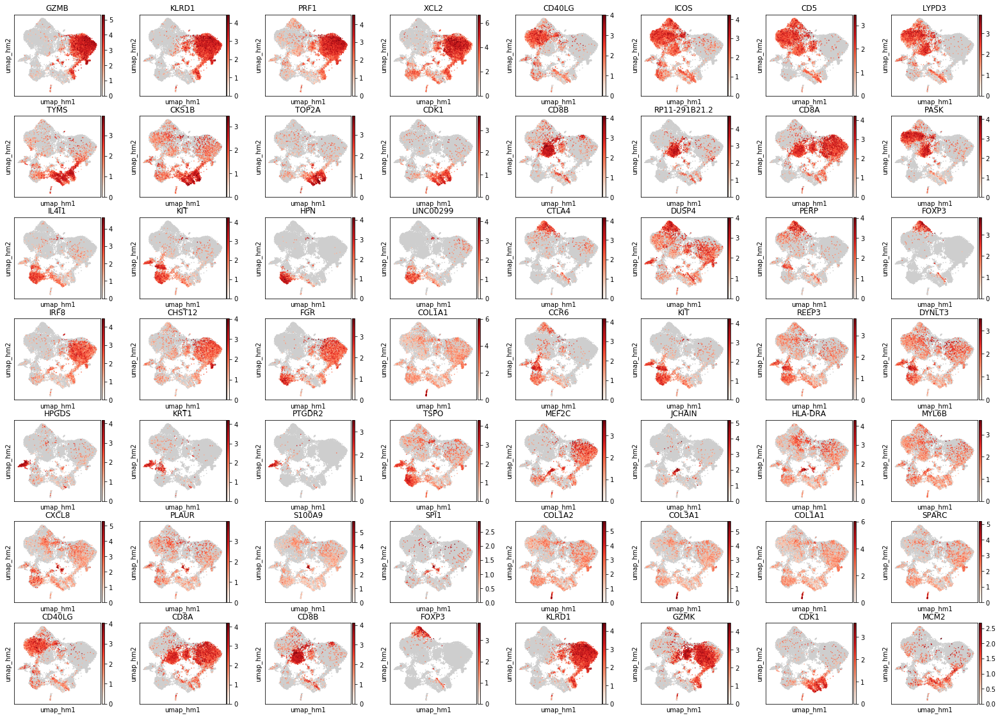

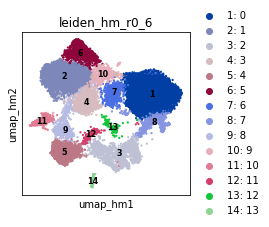

In [29]:
hm_de_genes1 = diffexp(
    ad1, basis='umap', key='hm', res=0.6, method='t-test_overestim_var',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK', 'CDK1', 'MCM2']
)
hm_de_genes1.groupby('cluster').head(5)

In [38]:
hm_de_genes1.groupby('cluster').head(30).to_csv('2.3_T_cells_harmony_withCC_leiden_r0_6_DE_filtered_top30.txt', sep='\t', index=False)

In [40]:
ss.lib.extract_de_table(ad1.uns['rank_genes_groups_hm_r0_6']).groupby('cluster').head(200).to_csv(
    '2.3_T_cells_harmony_withCC_leiden_r0_6_DE_top200.txt', sep='\t', index=False)

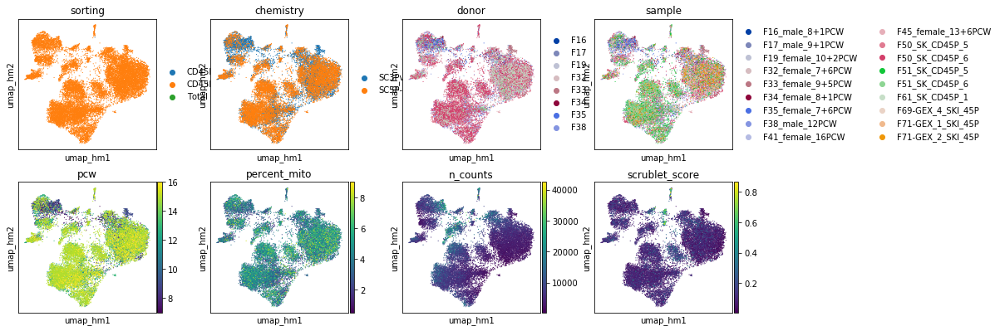

In [163]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_hm',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=5)

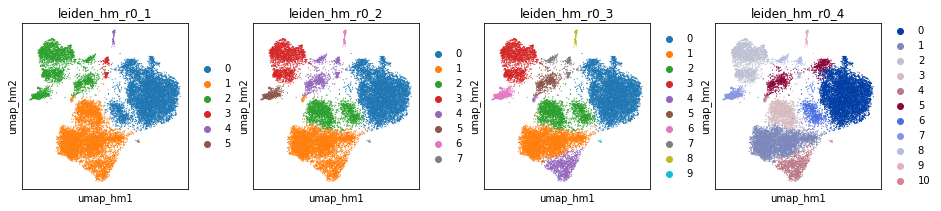

In [164]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_hm', color=[f'leiden_hm_r0_{i}' for i in (1,2,3,4)], size=5)

In [165]:
doublet_freq = ad2.obs.groupby('leiden_hm_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq             p
leiden_hm_r0_4                        
0               0.003608  7.720122e-01
1               0.005811  7.720122e-01
2               0.000467  7.720122e-01
3               0.008480  7.720122e-01
4               0.004902  7.720122e-01
5               0.004077  7.720122e-01
6               0.138770  0.000000e+00
7               0.000000  7.720122e-01
8               0.261830  0.000000e+00
9               0.051948  1.536734e-12
10              0.000000  7.720122e-01


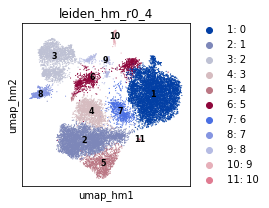

In [166]:
ss.lib.plot_embedding(ad2, basis='umap_hm', groupby='leiden_hm_r0_4', size=5)

,cluster,ref,rank,genes,scores
1,0,rest,1,TYROBP,0.541029
3,0,rest,3,GZMH,0.347370
4,0,rest,4,IL2RB,0.296544
7,0,rest,7,GNLY,0.242754
8,0,rest,8,KLRD1,0.232107
20010,1,rest,5,ICOS,0.359335
40013,2,rest,3,ZBTB16,0.276195
40015,2,rest,5,JAML,0.226209
40022,2,rest,12,TOX2,0.195954
40035,2,rest,25,ALDOC,0.170105


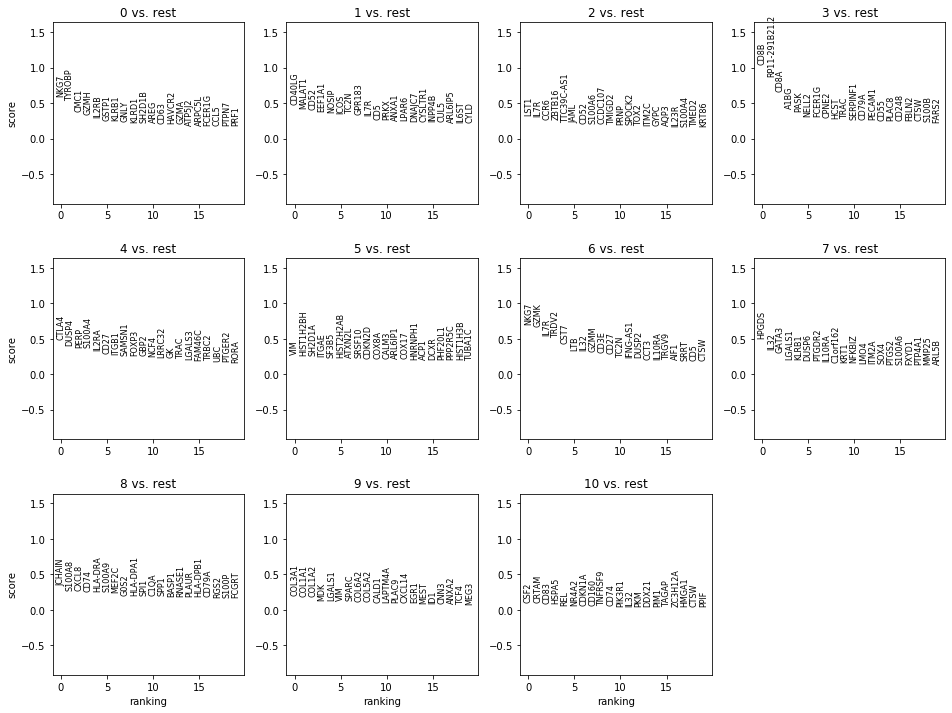

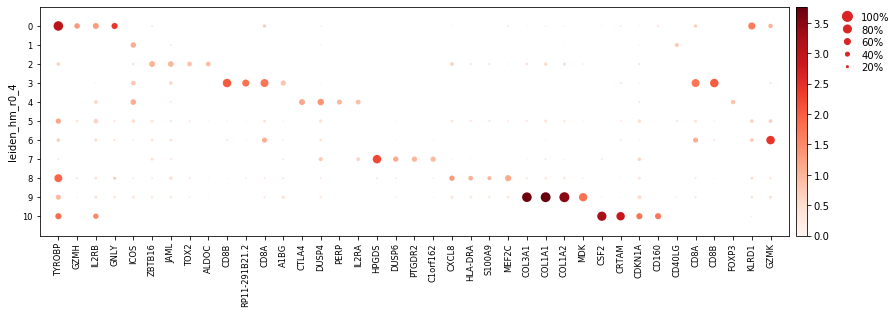

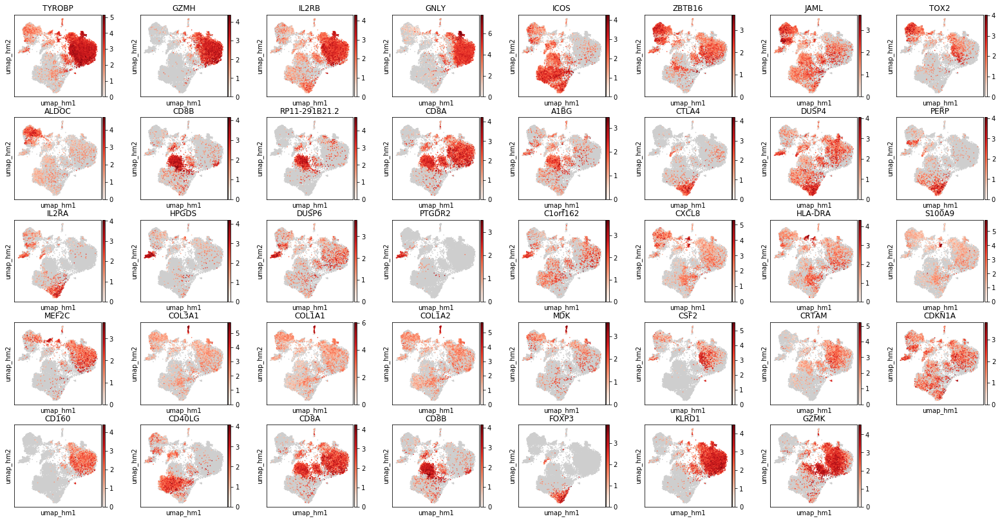

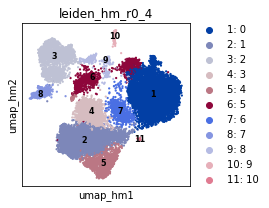

In [168]:
hm_de_genes2 = diffexp(
    ad2, basis='umap', key='hm', res=0.4,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK']
)
hm_de_genes2.groupby('cluster').head(5)

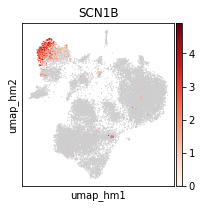

In [169]:
plot_scatter(ad2, basis='umap_hm', color='SCN1B', color_map=expr_cmap, size=5)

# 4.2 BBKNN

In [121]:
ad1.uns['neighbors'] = ad1.uns['neighbors_orig']
bbknn.bbknn(ad1, batch_key='sample', metric='euclidean', neighbors_within_batch=2, trim=15, copy=False)
ad1.uns['neighbors_bk'] = ad1.uns['neighbors']

In [122]:
ss.lib.umap(ad1, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 18292 × 20567 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'rank_genes_groups_orig_r0_1', 'rank_genes_groups_orig_r0_1_filtered', 'neighbors_bk', 'leiden_bk_r0_1_colors', 'leiden_b

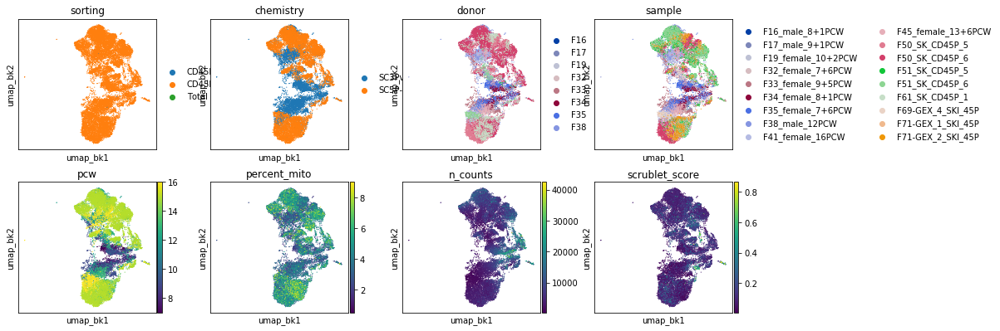

In [123]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_bk',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'],
             size=5)

In [124]:
ss.lib.leiden(ad1, use_graph='neighbors_bk', key_added='bk', resolution=[0.1, 0.2, 0.3, 0.4, 0.5,])

AnnData object with n_obs × n_vars = 18292 × 20567 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'rank_genes_groups_orig_r0_1', 'rank_genes_groups_orig_r0_1_filtered', 'neighbors_bk', 'leiden_bk_r0_1_colors', 'leiden_b

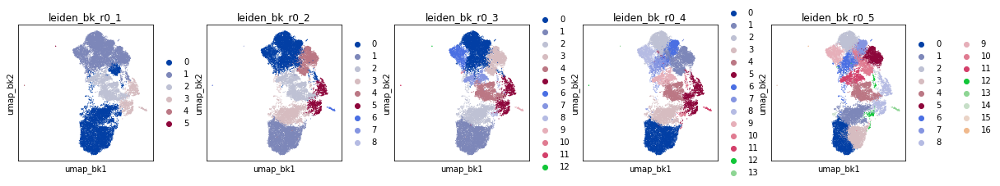

In [125]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_bk', color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in (0.1, 0.2, 0.3, 0.4, 0.5,)], size=5, ncols=5)

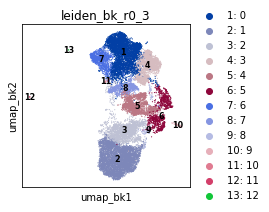

In [175]:
rcParams.update({'figure.figsize':(3,3)})
ss.lib.plot_embedding(ad1, basis='umap_bk', groupby='leiden_bk_r0_3', size=5)

In [173]:
doublet_freq = ad1.obs.groupby('leiden_bk_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq             p
leiden_bk_r0_3                        
0               0.005875  4.330121e-01
1               0.006144  4.178394e-01
2               0.000000  7.500003e-01
3               0.056174  7.438494e-14
4               0.000000  7.500003e-01
5               0.004699  5.000000e-01
6               0.004771  4.958919e-01
7               0.002375  6.306444e-01
8               0.462428  0.000000e+00
9               0.060606  5.551115e-16
10              0.000000  7.500003e-01
11              0.000000  7.500003e-01
12              0.000000  7.500003e-01


In [174]:
doublet_freq = ad1.obs.groupby('leiden_bk_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                   score         p
leiden_bk_r0_3                    
0               0.075958  0.576394
1               0.066383  0.720412
2               0.052682  0.873702
3               0.108951  0.123856
4               0.080672  0.500000
5               0.098257  0.236128
6               0.085966  0.414338
7               0.106697  0.143715
8               0.381415  0.000000
9               0.362315  0.000000
10              0.073188  0.620166
11              0.064171  0.750000
12              0.075554  0.582853


,cluster,ref,rank,genes,scores
27,0,rest,27,ICOS,0.232294
20577,1,rest,10,SH2D1B,0.252760
20581,1,rest,14,GNLY,0.217214
20618,1,rest,51,IFNG,0.151127
20969,1,rest,402,AOAH,0.081134
21315,1,rest,748,GZMB,0.061752
41135,2,rest,1,GZMH,0.333802
41137,2,rest,3,C1orf56,0.303136
41185,2,rest,51,SPP1,0.154714
41223,2,rest,89,NDUFB8,0.133607


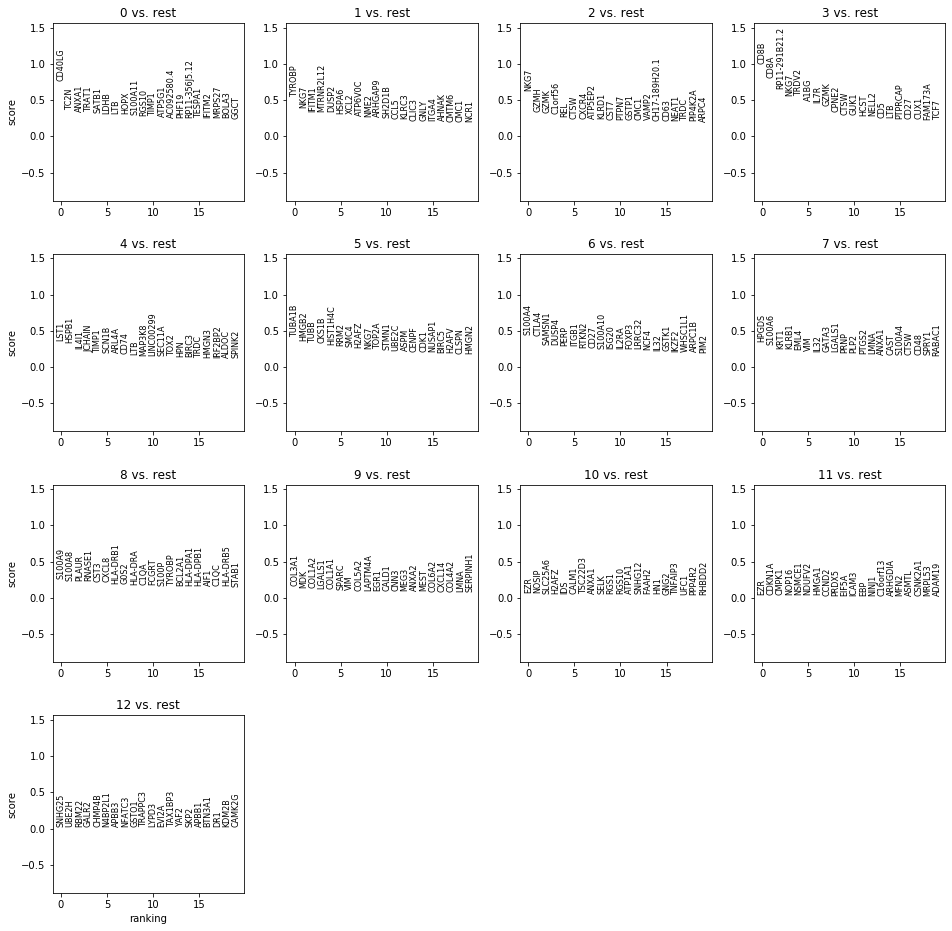

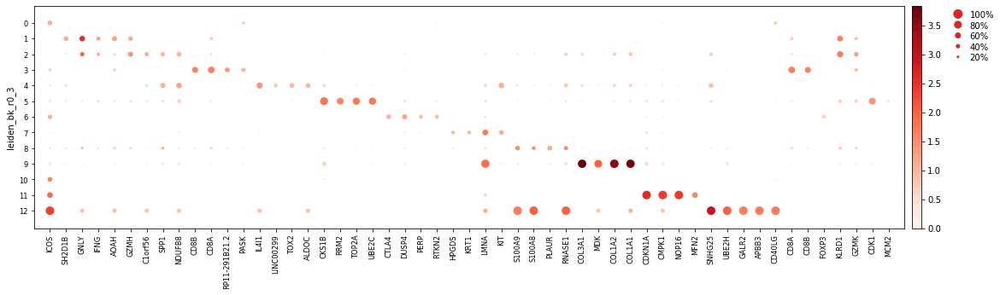

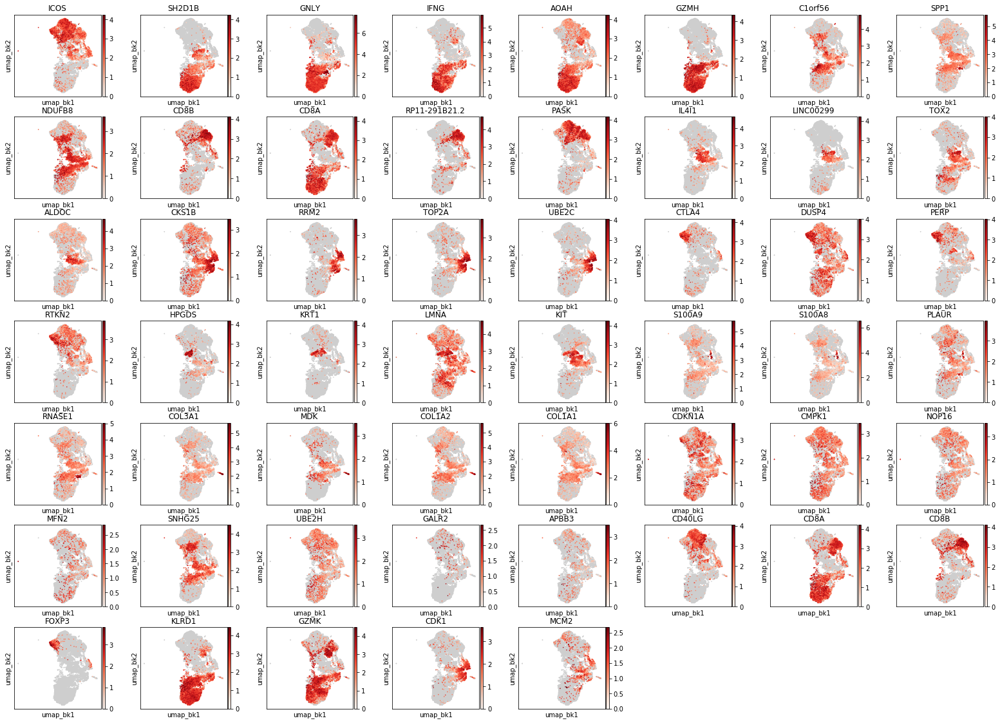

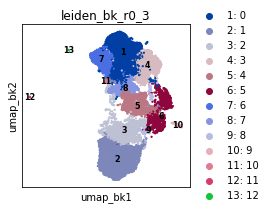

In [176]:
bk_de_genes1 = diffexp(
    ad1, basis='umap', key='bk', res=0.3,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK', 'CDK1', 'MCM2']
)
bk_de_genes1.groupby('cluster').head(5)

In [129]:
ad2.uns['neighbors'] = ad2.uns['neighbors_orig']
bbknn.bbknn(ad2, batch_key='sample', metric='euclidean', neighbors_within_batch=2, trim=15, copy=False)
ad2.uns['neighbors_bk'] = ad2.uns['neighbors']

In [130]:
ss.lib.umap(ad2, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 18292 × 20005 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_bk'
    obsm: 'X_pca', 'X_umap_orig', 'X_umap_bk'
    varm: 'PCs'

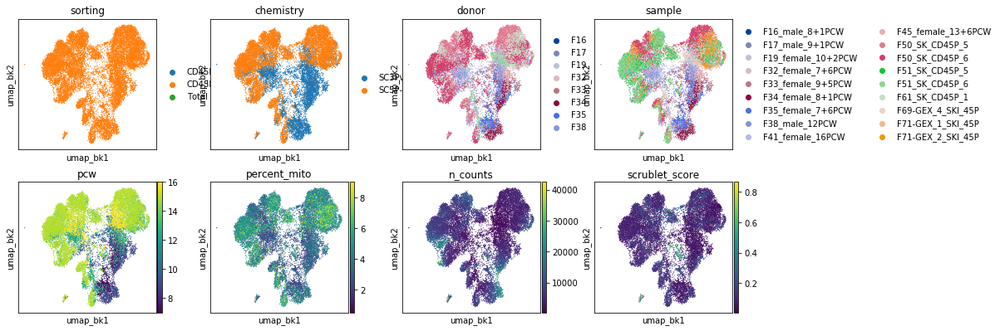

In [131]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_bk',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'],
             size=5)

In [132]:
ss.lib.leiden(ad2, use_graph='neighbors_bk', key_added='bk', resolution=[0.1, 0.2, 0.3, 0.4, 0.5,])

AnnData object with n_obs × n_vars = 18292 × 20005 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_bk'
    obsm: 'X_pca', 'X_umap_orig', 'X_umap_bk'
    varm: 'PCs'

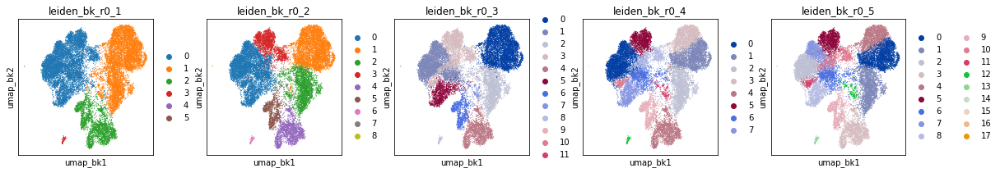

In [133]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(
    ad2, basis='umap_bk',
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in (0.1, 0.2, 0.3, 0.4, 0.5,)], size=5, ncols=5)

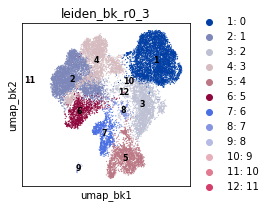

In [142]:
rcParams.update({'figure.figsize':(3,3)})
ss.lib.plot_embedding(ad2, basis='umap_bk', groupby='leiden_bk_r0_3', size=5)

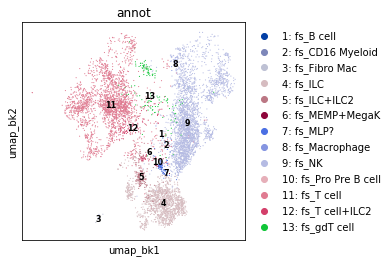

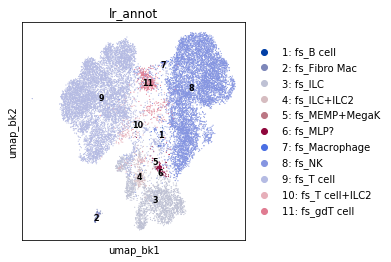

In [144]:
rcParams.update({'figure.figsize':(4,4)})
k_annot = (ad2.obs['annot'] != 'nan').values
ss.lib.plot_embedding(ad2[k_annot, :], basis='umap_bk', groupby='annot', size=5)
ss.lib.plot_embedding(ad2, basis='umap_bk', groupby='lr_annot', size=5)

In [140]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq             p
leiden_bk_r0_3                        
0               0.010236  7.300197e-02
1               0.004649  3.851025e-01
2               0.000000  7.500003e-01
3               0.036343  2.952860e-12
4               0.000000  7.500003e-01
5               0.004314  4.119661e-01
6               0.002174  5.880339e-01
7               0.443850  0.000000e+00
8               0.060606  0.000000e+00
9               0.000000  7.500003e-01
10              0.000000  7.500003e-01
11              0.000000  7.500003e-01


In [141]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                   score         p
leiden_bk_r0_3                    
0               0.070056  0.591702
1               0.073592  0.542051
2               0.056959  0.757977
3               0.103805  0.165089
4               0.079504  0.457949
5               0.087082  0.353340
6               0.107795  0.132151
7               0.374438  0.000000
8               0.362315  0.000000
9               0.030245  0.950952
10              0.058785  0.737138
11              0.058376  0.741887


,cluster,ref,rank,genes,scores
4,0,rest,4,ICOS,0.328682
1546,0,rest,1546,CCR7,0.051647
19025,0,rest,19025,LEF1,-0.077806
20012,1,rest,7,GNLY,0.288613
20020,1,rest,15,SH2D1B,0.215433
20283,1,rest,278,AOAH,0.090369
20634,1,rest,629,KLRD1,0.066590
20957,1,rest,952,IFNG,0.053515
40012,2,rest,2,C1orf56,0.344741
40019,2,rest,9,GZMK,0.311274


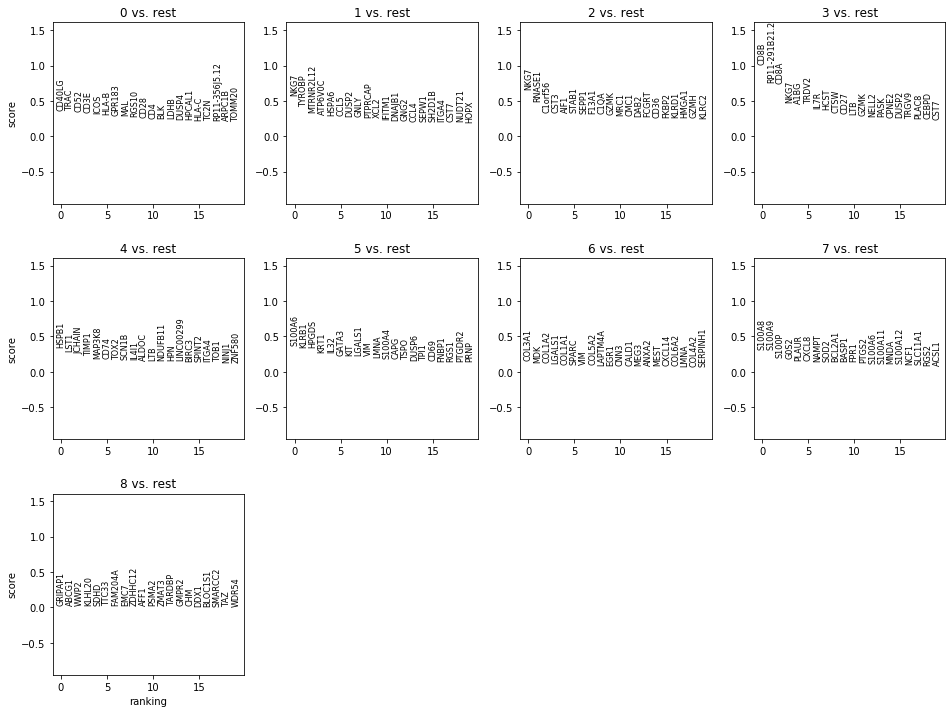

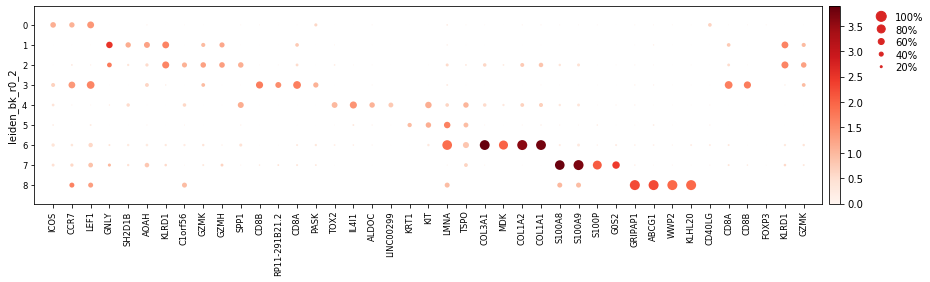

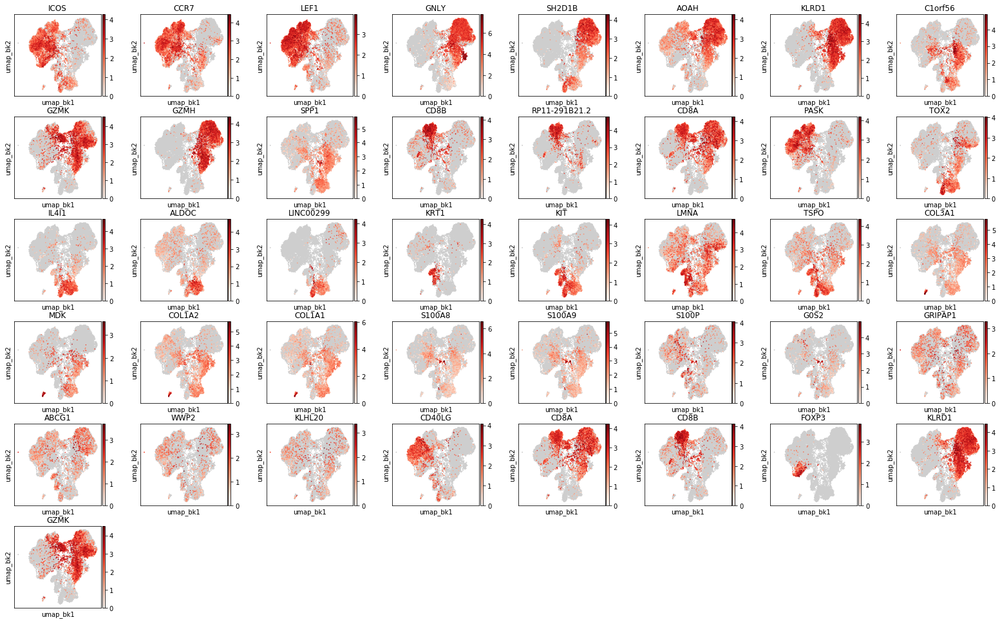

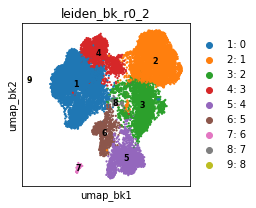

In [138]:
bk_de_genes2 = diffexp(
    ad2, basis='umap', key='bk', res=0.2,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK']
)
bk_de_genes2.groupby('cluster').head(5)

,cluster,ref,rank,genes,scores
8,0,rest,8,GNLY,0.258056
16,0,rest,16,SH2D1B,0.209923
74,0,rest,74,KLRD1,0.127587
144,0,rest,144,AOAH,0.105028
983,0,rest,983,IFNG,0.046869
20054,1,rest,49,ICOS,0.190307
40011,2,rest,1,C1orf56,0.414800
40012,2,rest,2,GZMK,0.394007
40014,2,rest,4,GZMH,0.292093
40162,2,rest,152,PSMA2,0.124923


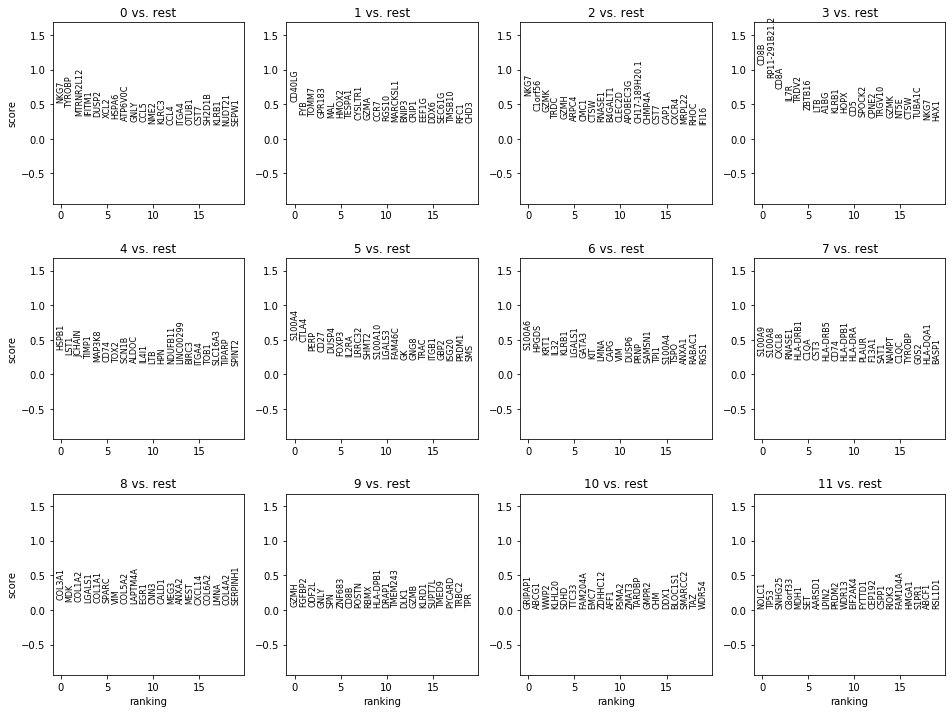

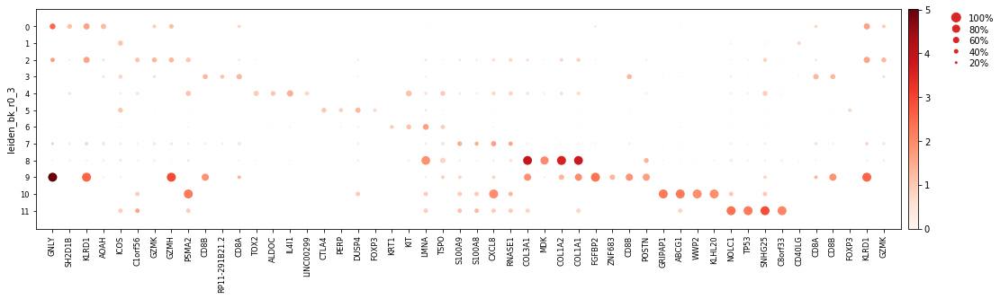

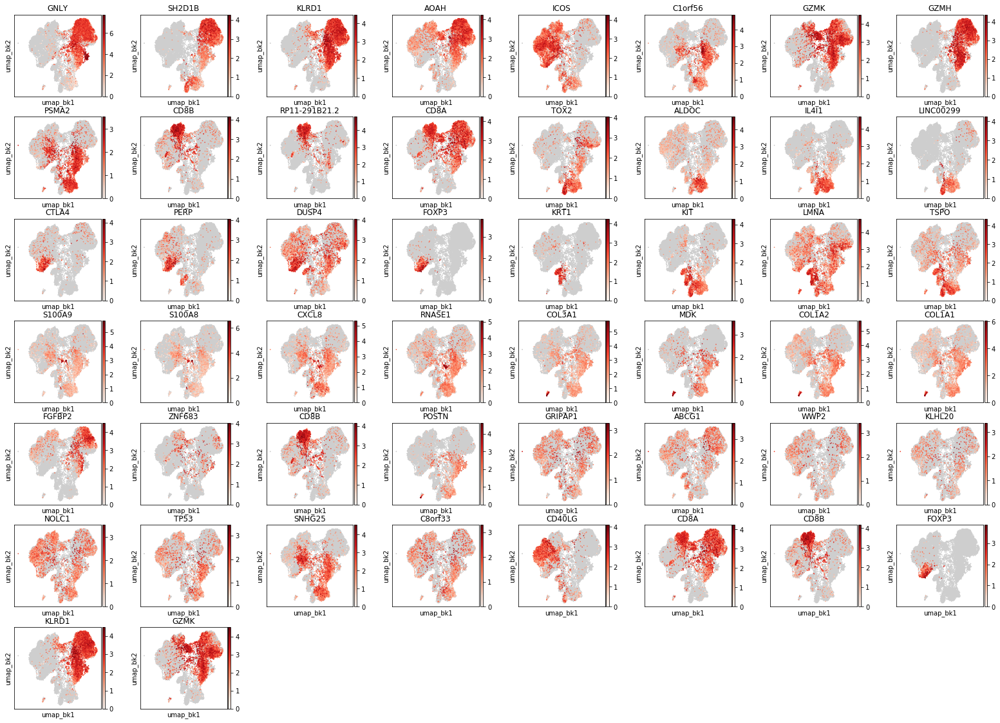

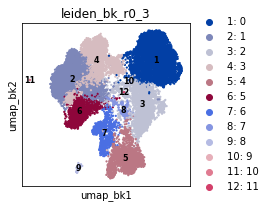

In [139]:
bk_de_genes2 = diffexp(
    ad2, basis='umap', key='bk', res=0.3,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK']
)
bk_de_genes2.groupby('cluster').head(5)

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
11,0,rest,11,GZMB,59.070953,4.020739,0.000000e+00,0.000000e+00
19,0,rest,19,GNLY,55.804749,4.467519,0.000000e+00,0.000000e+00
22,0,rest,22,KLRD1,54.666611,3.162036,0.000000e+00,0.000000e+00
27,0,rest,27,AOAH,48.295742,2.907533,0.000000e+00,0.000000e+00
28,0,rest,28,SH2D1B,48.158974,3.627403,0.000000e+00,0.000000e+00
20032,1,rest,27,ICOS,38.170612,2.362924,0.000000e+00,0.000000e+00
40023,2,rest,13,C1orf56,36.790733,3.666779,2.597169e-296,1.574436e-293
40025,2,rest,15,NDUFB8,36.107944,2.571943,1.702000e-285,9.457922e-283
40028,2,rest,18,SPP1,34.805038,2.828971,2.040876e-265,1.046865e-262
40029,2,rest,19,PSMA2,34.785423,2.744241,4.040400e-265,2.020705e-262


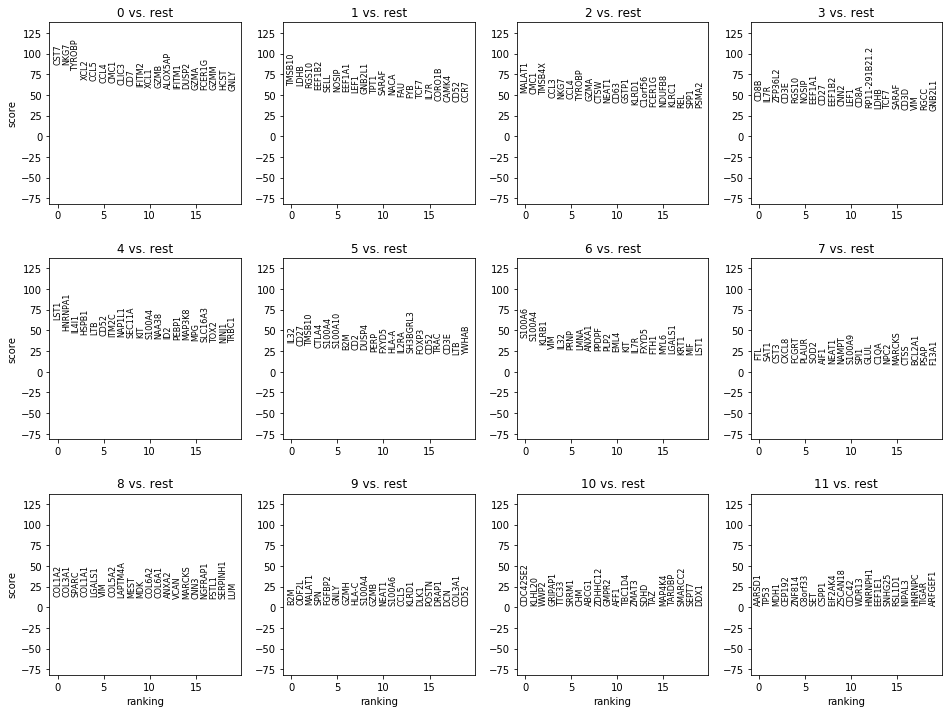

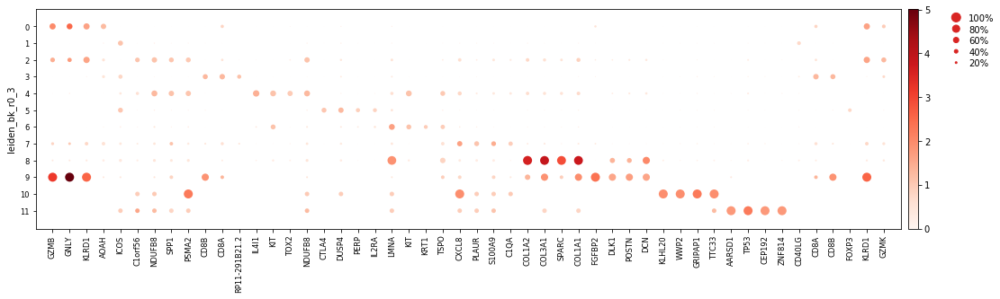

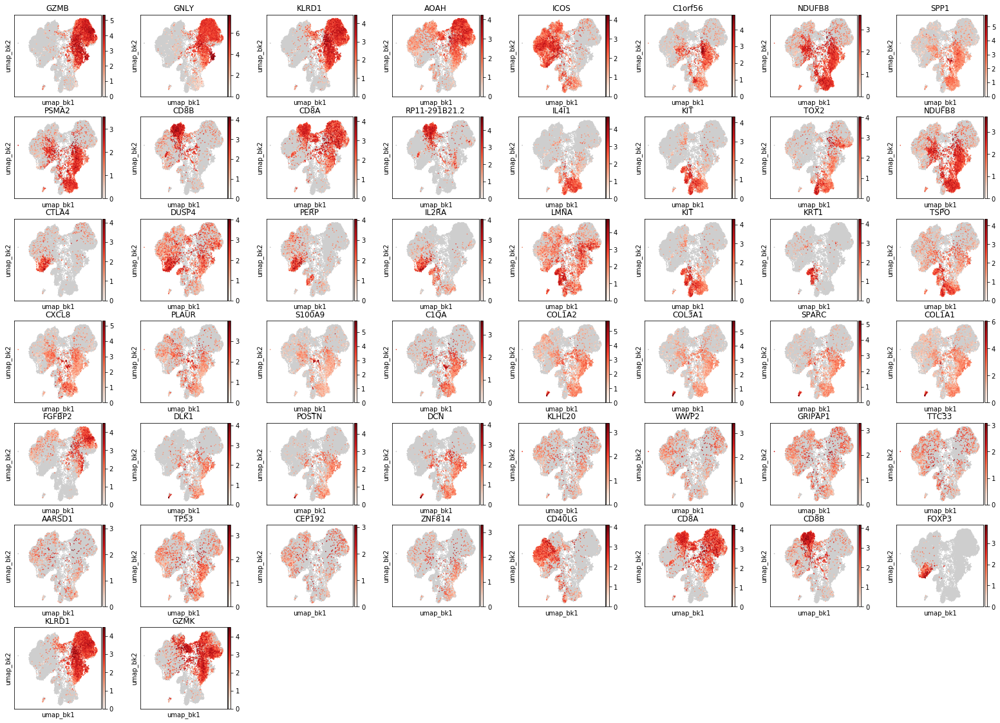

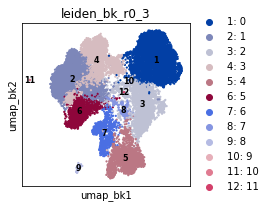

In [146]:
bk_de_genes2 = diffexp(
    ad2, basis='umap', key='bk', res=0.3, method='wilcoxon',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK']
)
bk_de_genes2.groupby('cluster').head(5)

(0, 100)

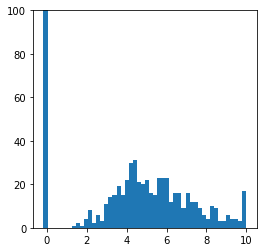

In [57]:
plt.hist(ad1.X[:, ad1.var_names=='FOXP3'], 50)
plt.ylim(0, 100)

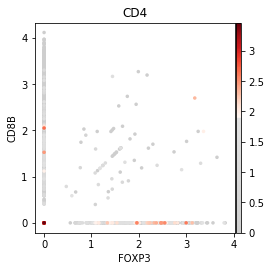

In [61]:
ss.lib.set_figsize((4,4))
sc.pl.scatter(ad1, x='FOXP3', y='CD8B', color='CD4', color_map=ss.lib.expression_colormap(0.55), size=50)

In [65]:
(ad1.obs['bh_doublet_pval'] < 0.05).value_counts()

False    18061
True       231
Name: bh_doublet_pval, dtype: int64

# 5. Compare clustering

In [182]:
adt = ad1.copy()
adt.obs['leiden_orig_nocc_r0_1'] = ad2.obs['leiden_orig_r0_1']
adt.obs['leiden_hm_nocc_r0_3'] = ad2.obs['leiden_hm_r0_3']
adt.obs['leiden_bk_nocc_r0_3'] = ad2.obs['leiden_bk_r0_3']

In [183]:
adt.obsm['X_umap_nocc_orig'] = ad2.obsm['X_umap_orig']
adt.obsm['X_umap_nocc_hm'] = ad2.obsm['X_umap_hm']
adt.obsm['X_umap_nocc_bk'] = ad2.obsm['X_umap_bk']

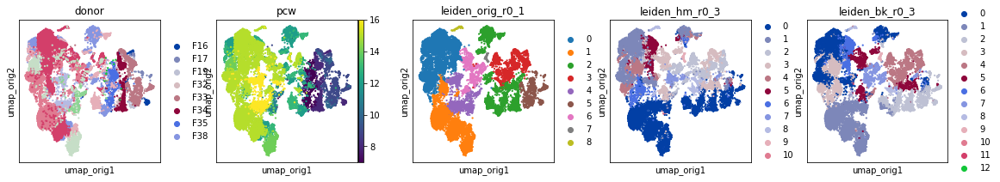

In [184]:
plot_scatter(
    adt, basis='umap_orig',
    color=['donor', 'pcw', 'leiden_orig_r0_1', 'leiden_hm_r0_3', 'leiden_bk_r0_3'], ncols=5, size=20)

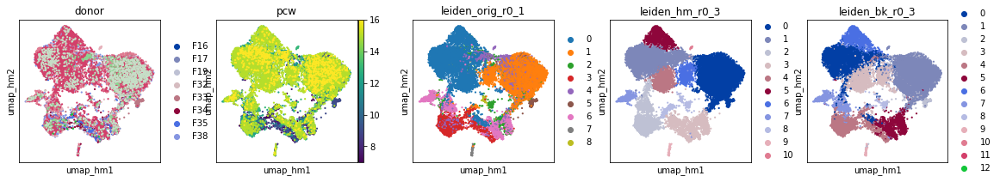

In [185]:
plot_scatter(
    adt, basis='umap_hm',
    color=['donor', 'pcw', 'leiden_orig_r0_1', 'leiden_hm_r0_3', 'leiden_bk_r0_3'], ncols=5, size=20)

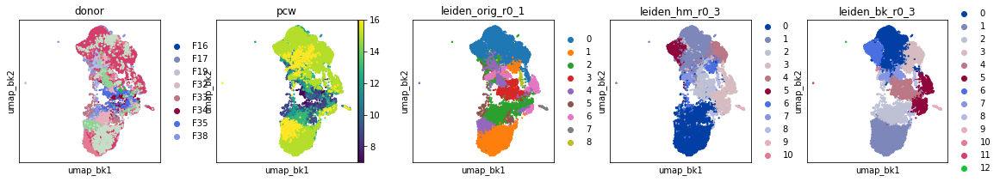

In [186]:
plot_scatter(
    adt, basis='umap_bk',
    color=['donor', 'pcw', 'leiden_orig_r0_1', 'leiden_hm_r0_3', 'leiden_bk_r0_3'], ncols=5, size=20)

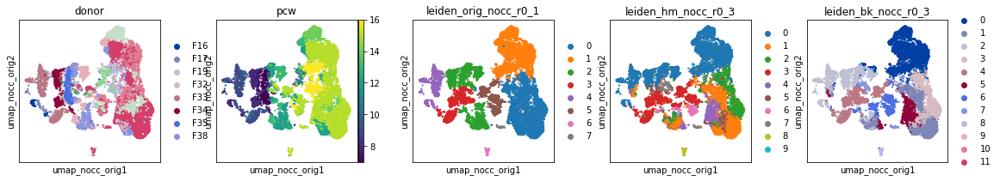

In [187]:
plot_scatter(
    adt, basis='umap_nocc_orig',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_1', 'leiden_hm_nocc_r0_3', 'leiden_bk_nocc_r0_3'], ncols=5, size=20)

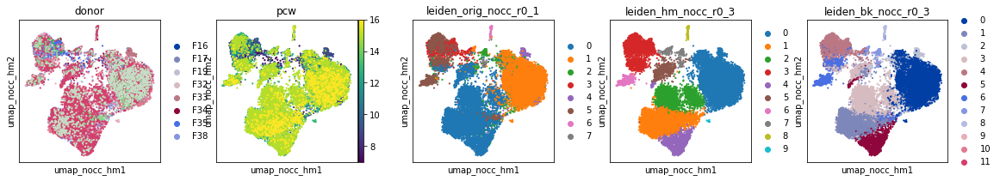

In [188]:
plot_scatter(
    adt, basis='umap_nocc_hm',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_1', 'leiden_hm_nocc_r0_3', 'leiden_bk_nocc_r0_3'], ncols=5, size=20)

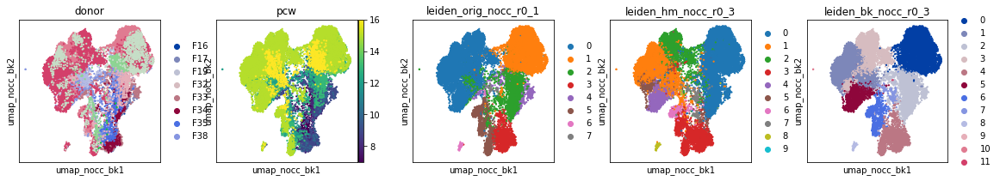

In [190]:
plot_scatter(
    adt, basis='umap_nocc_bk',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_1', 'leiden_hm_nocc_r0_3', 'leiden_bk_nocc_r0_3'], ncols=5, size=20)

In [192]:
ss.lib.cross_table(adt, 'leiden_orig_nocc_r0_1', 'leiden_orig_r0_1', highlight=True)

leiden_orig_r0_1,0,1,2,3,4,5,6,7,8
leiden_orig_nocc_r0_1,,,,,,,,,
0,5665,370,0,0,457,0,320,0,0
1,2,3726,1,0,856,0,154,0,0
2,1,0,2992,5,7,5,0,0,0
3,0,0,11,1408,0,0,0,0,0
4,0,0,15,7,0,1130,0,0,0
5,0,2,1,304,125,0,596,0,0
6,0,0,0,0,0,0,0,68,0
7,0,0,0,0,0,0,0,0,64


In [193]:
ss.lib.cross_table(adt, 'leiden_hm_nocc_r0_3', 'leiden_hm_r0_3', highlight=True)

leiden_hm_r0_3,0,1,2,3,4,5,6,7,8,9,10
leiden_hm_nocc_r0_3,,,,,,,,,,,
0,6554,16,0,487,0,0,19,1,3,1,0
1,2,4329,3,104,20,22,3,6,4,0,0
2,13,55,79,29,1369,2,632,2,10,0,0
3,3,13,1749,356,0,0,2,4,18,0,0
4,1,28,0,62,2,913,1,0,1,0,0
5,12,38,3,517,2,0,5,0,13,0,0
6,0,1,1,10,0,0,0,371,1,0,0
7,1,0,4,5,0,0,0,0,301,0,0
8,1,0,0,0,0,0,0,0,0,75,0


In [194]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_3', 'leiden_bk_r0_3', highlight=True)

leiden_bk_r0_3,0,1,2,3,4,5,6,7,8,9,10,11,12
leiden_bk_nocc_r0_3,,,,,,,,,,,,,
0,13,4493,28,46,0,202,1,3,1,0,0,0,0
1,3903,3,4,30,0,97,33,0,1,0,11,3,2
2,47,49,2160,2,14,364,21,8,0,0,0,0,0
3,512,2,2,1807,0,281,4,6,0,0,0,0,0
4,3,0,10,0,1764,14,0,7,0,0,0,0,0
5,67,0,10,2,0,77,989,6,8,0,0,0,0
6,44,7,1,0,33,22,0,812,1,0,0,0,0
7,5,3,4,0,6,7,0,0,162,0,0,0,0
8,0,0,0,0,0,0,0,0,0,66,0,0,0


In [195]:
ss.lib.cross_table(adt, 'leiden_bk_r0_3', 'leiden_orig_r0_1', highlight=True)

leiden_orig_r0_1,0,1,2,3,4,5,6,7,8
leiden_bk_r0_3,,,,,,,,,
0,3404,0,717,0,387,80,4,0,4
1,2,3596,133,0,796,21,5,4,0
2,0,3,1307,3,20,891,0,0,0
3,1347,465,38,0,33,2,0,0,2
4,0,3,23,1698,91,0,2,0,2
5,61,6,369,13,65,64,486,0,0
6,845,0,115,0,24,64,0,0,0
7,4,8,226,8,15,8,573,0,0
8,5,17,90,0,0,5,0,0,56


In [196]:
ss.lib.cross_table(adt, 'leiden_bk_r0_3', 'leiden_hm_r0_3', highlight=True)

leiden_hm_r0_3,0,1,2,3,4,5,6,7,8,9,10
leiden_bk_r0_3,,,,,,,,,,,
0,9,4139,92,139,145,18,36,2,16,0,0
1,4462,22,0,3,0,0,47,1,5,4,13
2,2048,33,3,6,1,7,103,5,12,6,0
3,37,68,37,21,1240,3,468,1,12,0,0
4,6,36,1274,365,0,0,0,2,135,1,0
5,24,6,0,1023,0,0,0,4,7,0,0
6,0,123,1,8,4,905,7,0,0,0,0
7,0,30,432,4,0,3,0,369,4,0,0
8,1,6,0,1,3,1,1,0,160,0,0


In [197]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_3', 'leiden_hm_nocc_r0_3', highlight=True)

leiden_hm_nocc_r0_3,0,1,2,3,4,5,6,7,8,9
leiden_bk_nocc_r0_3,,,,,,,,,,
0,4661,13,93,3,0,0,1,3,0,13
1,8,3822,83,3,17,148,2,4,0,0
2,2344,64,126,9,12,86,8,11,5,0
3,46,358,1860,55,5,284,1,5,0,0
4,7,20,1,1619,0,40,3,107,1,0
5,2,139,16,1,974,25,0,1,1,0
6,5,70,9,455,0,3,369,5,4,0
7,4,2,3,0,0,3,0,175,0,0
8,0,1,0,0,0,0,0,0,65,0


In [198]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_3', 'leiden_orig_nocc_r0_1', highlight=True)

leiden_orig_nocc_r0_1,0,1,2,3,4,5,6,7
leiden_bk_nocc_r0_3,,,,,,,,
0,28,4624,131,0,4,0,0,0
1,3362,3,677,0,44,0,0,1
2,6,16,1635,18,988,2,0,0
3,2447,66,93,0,0,6,0,2
4,3,2,19,1390,1,381,0,2
5,945,0,116,0,97,0,0,1
6,14,4,242,7,9,639,4,1
7,7,24,93,2,4,0,0,57
8,0,0,0,2,0,0,64,0


In [41]:
ad1.write('data/h5ad/fetal_skin_hierarch1_T-cells_processed.h5ad', compression='gzip')
ad2.write('data/h5ad/fetal_skin_hierarch1_T-cells_processed_nocc.h5ad', compression='gzip')

In [4]:
ad1 = sc.read('data/h5ad/fetal_skin_hierarch1_T-cells_processed.h5ad')
ad2 = sc.read('data/h5ad/fetal_skin_hierarch1_T-cells_processed_nocc.h5ad')

In [10]:
ad1.obsm['X_umap_hm_nocc'] = ad2.obsm['X_umap_hm']
for r in (1,2,3,4):
    ad1.obs[f'leiden_hm_nocc_r0_{r}'] = ad2.obs[f'leiden_hm_r0_{r}']

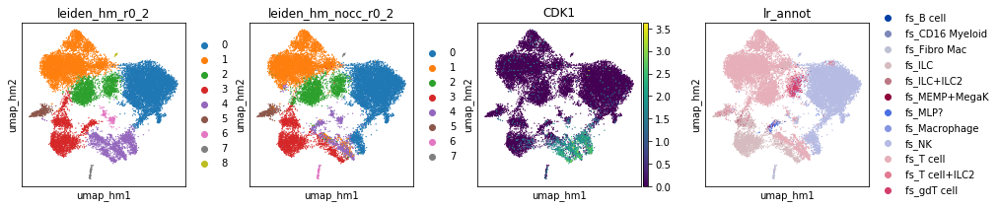

In [19]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm', color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'lr_annot'])

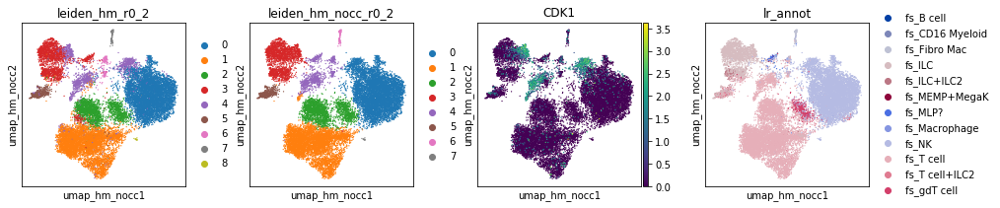

In [20]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm_nocc', color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'lr_annot'])

# 6. Trajectory

In [233]:
ad3 = ad1[~ad1.obs['leiden_hm_r0_3'].isin(['6', '7', '8', '9', '10']), :]

In [234]:
ss.lib.paga(ad3, use_graph='neighbors_hm', key_added='hm', groups='leiden_hm_r0_3')

AnnData object with n_obs × n_vars = 16806 × 20567 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'rank_ge

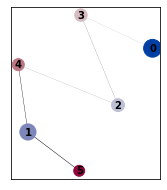

In [235]:
ss.lib.plot_paga(ad3, use_key='paga_hm', solid_edges='connectivities_tree', edge_width_scale=0.25, color='pcw', size=20)

In [ ]:
ss.lib.fdg(ad3, use_graph='neighbors_bk', init_pos='paga', key_added='bk', layout='fa')

In [ ]:
ss.lib.plot_paga(ad3, use_key='paga_hm', basis='draw_graph_fa_bk', solid_edges='connectivities_tree', edge_width_scale=0.25, color='pcw', size=20)

In [231]:
ss.lib.umap(ad3, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 1528 × 18031 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', '__is_in_cluster__', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_bk_r0_6', 'leiden_bk_r0_7', 'leiden_bk_r0_8', 'leiden_bk_r0_9', 'leiden_bk_r1_0'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'rank_genes_groups_orig_r0_3', 'rank_genes_groups_orig_r0_3_filtered', 'leiden_orig_r0_3_colors', 'neighbors_hm', 'leiden_hm_r0_1_colors', 'leiden_hm_r0_2_colors', 

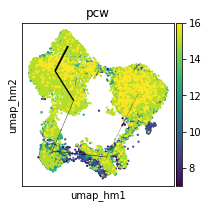

In [236]:
ss.lib.plot_paga(ad3, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='pcw', size=20)

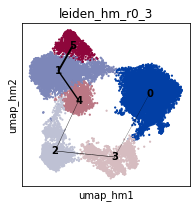

In [237]:
ss.lib.plot_paga(ad3, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='leiden_hm_r0_3', size=20)

In [239]:
ad4 = ad2[~ad2.obs['leiden_hm_r0_4'].isin(['6', '8', '9', '10']), :]

In [240]:
ss.lib.paga(ad4, use_graph='neighbors_hm', key_added='hm', groups='leiden_hm_r0_4')

AnnData object with n_obs × n_vars = 17186 × 20005 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_bk', 'leiden_bk_r0_1_colors', 'leiden_bk_r0_2_color

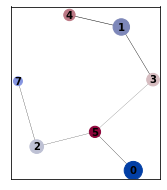

In [242]:
ss.lib.plot_paga(ad4, use_key='paga_hm', solid_edges='connectivities_tree', edge_width_scale=0.25, color='pcw', size=20)

In [ ]:
ss.lib.fdg(ad4, use_graph='neighbors_bk', init_pos='paga', key_added='bk', layout='fa')

In [ ]:
ss.lib.plot_paga(ad4, use_key='paga_bk', basis='draw_graph_fa_bk', solid_edges='connectivities_tree', edge_width_scale=0.25, color='pcw', size=20)

In [231]:
ss.lib.umap(ad3, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 1528 × 18031 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', '__is_in_cluster__', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_bk_r0_6', 'leiden_bk_r0_7', 'leiden_bk_r0_8', 'leiden_bk_r0_9', 'leiden_bk_r1_0'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'rank_genes_groups_orig_r0_3', 'rank_genes_groups_orig_r0_3_filtered', 'leiden_orig_r0_3_colors', 'neighbors_hm', 'leiden_hm_r0_1_colors', 'leiden_hm_r0_2_colors', 

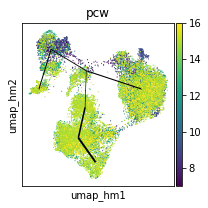

In [245]:
ss.lib.plot_paga(ad4, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='pcw', size=5)

# 4.3 Seurat

In [80]:
%%R
.libPaths()

[1] "/home/ubuntu/miniconda/envs/scrna/lib/R/library"


In [75]:
%%R
srt <- Seurat::ReadH5AD('data/h5ad/fetal_skin_hierarch1_keratinocytes.h5ad')


Error in ReadH5AD.character("data/h5ad/fetal_skin_hierarch1_keratinocytes.h5ad") : 
  Please install hdf5r' for h5ad capabilities


In [48]:
adi = sc.read('data/h5ad/fetal_skin_hierarch1_myeloid-cells_seurat-integrated.h5ad')

In [49]:
adi

AnnData object with n_obs × n_vars = 40139 × 2000 
    obs: 'bh.doublet.pval', 'cell.caller', 'cluster.scrublet.score', 'doublet.pval', 'mt.prop', 'nCount_RNA', 'nFeatures_RNA', 'sanger.id', 'scrublet.score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry.sorting', 'annot', 'doublet', 'hierarchy1', 'percent.mito', 'percent.ribo', 'percent.hb', 'nFeature_RNA', 'integrated_snn_res.0.5', 'seurat_clusters'
    var: 'feature_name'
    obsm: 'X_pca', 'X_umap'

In [50]:
adi.obs = adi.obs[['seurat_clusters']].merge(ad.obs, how='left', left_index=True, right_index=True)

In [ ]:
rcParams.update({'figure.figsize':(4,4)})
sc.pl.umap(adi, color=['sorting', 'chemistry', 'donor', 'sample', 'pcw'])

In [ ]:
rcParams.update({'figure.figsize':(4,4)})
ss.lib.plot_embedding(adi[k_annot,:], basis='umap', groupby='annot')
ss.lib.plot_embedding(adi, basis='umap', groupby='seurat_clusters')

In [55]:
ss.lib.pca(adi, key_added='srt')

AnnData object with n_obs × n_vars = 40139 × 2000 
    obs: 'seurat_clusters', 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'lr_annot'
    var: 'feature_name'
    uns: 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'seurat_clusters_colors', 'pca'
    obsm: 'X_umap', 'X_pca_srt', 'X_pca'
    varm: 'PCs'

In [60]:
ss.lib.neighbors(adi, use_rep='X_pca_srt', key_added='srt', n_pcs=20)
ss.lib.umap(adi, use_graph='neighbors_srt', key_added='srt')

AnnData object with n_obs × n_vars = 40139 × 2000 
    obs: 'seurat_clusters', 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'lr_annot'
    var: 'feature_name'
    uns: 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'seurat_clusters_colors', 'pca', 'neighbors_srt', 'neighbors'
    obsm: 'X_pca_srt', 'X_pca', 'X_umap_srt', 'X_umap'
    varm: 'PCs'

In [63]:
ss.lib.leiden(adi, use_graph='neighbors_srt', key_added='srt', resolution=[0.1, 0.3, 0.5, 0.7])

AnnData object with n_obs × n_vars = 40139 × 2000 
    obs: 'seurat_clusters', 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'lr_annot', 'leiden_srt_r0_1', 'leiden_srt_r0_3', 'leiden_srt_r0_5', 'leiden_srt_r0_7'
    var: 'feature_name'
    uns: 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'seurat_clusters_colors', 'pca', 'neighbors_srt', 'neighbors', 'leiden'
    obsm: 'X_pca_srt', 'X_pca', 'X_umap_srt', 'X_umap'
    varm: 'PCs'

In [ ]:
rcParams.update({'figure.figsize':(4,4)})
plot_scatter(adi, basis='umap_srt', color=['sorting', 'chemistry', 'donor', 'sample', 'pcw'])

In [ ]:
rcParams.update({'figure.figsize':(4,4)})
plot_scatter(adi, basis='umap_srt', color=[f'leiden_srt_r0_{i}' for i in (1,3,5,7)])

In [ ]:
rcParams.update({'figure.figsize':(4,4)})
ss.lib.plot_embedding(adi[k_annot,:], basis='umap_srt', groupby='annot')
ss.lib.plot_embedding(adi, basis='umap_srt', groupby='seurat_clusters')

In [ ]:
rcParams.update({'figure.figsize':(2.5,2.5)})
plot_scatter(adi, basis='umap', color_map=expr_cmap,
             color=[
                 'HPGDS', 'LST1', 'CCR6', 'TUBA1B', 'TUBB', 'JCHAIN', 'MEF2C',
                 'NKG7', 'TYROBP', 'KIR3DL1', 'FGFBP2', 'HMGB2', 'STMN1', 'COL3A1', 'COL1A1',
                 'CD40LG', 'GPR183', 'CD8B', 'CD8A', 'CTLA4', 'PERP', 'FOXP3', 'S100A9', 'S100A8',
                 'TRDV2', 'GZMK', 'CDK1'
             ], size=1, ncols=8)

# 5.

In [ ]:
# ss.lib.annotate(ad, 'leiden_hm_r0_1', 'annot', ss.lib.cross_table(ad, 'annot', 'leiden_hm_r0_1', normalise='y', subset=k_annot).values.T)

In [ ]:
# ad.obs['leiden_hm_r0_3_annot'].cat.reorder_categories(sorted(ad.obs['leiden_hm_r0_3_annot'].cat.categories), inplace=True)